# Comparación Final

In [14]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from tabulate import tabulate
from statsmodels.tsa.arima_process import ArmaProcess
from sklearn.linear_model import Ridge
from scipy.stats import t
from scipy.linalg import svd, solve
from statsmodels.tsa.seasonal import seasonal_decompose
from bayes_opt import BayesianOptimization
import warnings
from scipy.stats import wasserstein_distance

try:
    import torch
    import torch.nn as nn
    import torch.optim as optim
    TORCH_AVAILABLE = True
except ImportError:
    TORCH_AVAILABLE = False
    print("PyTorch no está disponible. DeepAR funcionará en modo limitado.")

warnings.filterwarnings("ignore")


## Clases adicionales

### Simulador de series

In [15]:
class TimeSeriesSimulator:
    def __init__(self, phi, theta, noise_dist, sigma, n, burn_in):
        self.phi = phi
        self.theta = theta
        self.noise_dist = noise_dist
        self.sigma = sigma
        self.n = n
        self.burn_in = burn_in

    def generate_noise(self):
        """Genera ruido según la distribución especificada."""
        if self.noise_dist == 'normal':
            return np.random.normal(0, self.sigma, self.n)
        elif self.noise_dist == 'uniform':
            return np.random.uniform(-np.sqrt(3)*self.sigma, np.sqrt(3)*self.sigma, self.n)
        elif self.noise_dist == 'exponential':
            return np.random.exponential(scale=self.sigma, size=self.n) - self.sigma
        elif self.noise_dist == 't':
            return self.sigma * t.rvs(df=3, size=self.n)
        else:
            raise ValueError("Distribución no soportada")

    def simulate_arma(self, noise):
        """Simula una serie ARMA usando ruido predefinido."""
        arma = ArmaProcess(ar=np.r_[1, -np.array(self.phi)], ma=np.r_[1, self.theta])

        def noise_generator(size):
            return np.random.choice(noise, size=size, replace=True)

        series = arma.generate_sample(nsample=self.n, scale=1, distrvs=noise_generator)
        return series[self.burn_in:], noise[self.burn_in:]  # Serie y ruido limpio


### Simualción con cambios

In [16]:
from statsmodels.tsa.arima_process import ArmaProcess

class StructuralBreakSimulator:
    """Simulador de series con cambios estructurales"""
    
    def __init__(self, phi1, phi2, theta1, theta2, break_point, n, burn_in, noise_dist='normal', sigma=0.5):
        self.phi1 = phi1
        self.phi2 = phi2
        self.theta1 = theta1
        self.theta2 = theta2
        self.break_point = break_point
        self.n = n
        self.burn_in = burn_in
        self.noise_dist = noise_dist
        self.sigma = sigma

    def generate_noise(self):
        """Genera ruido según la distribución especificada"""
        if self.noise_dist == 'normal':
            return np.random.normal(0, self.sigma, self.n)
        elif self.noise_dist == 'uniform':
            return np.random.uniform(-self.sigma, self.sigma, self.n)
        elif self.noise_dist == 't':
            return self.sigma * np.random.standard_t(3, self.n)
        else:
            raise ValueError(f"Distribución no soportada: {self.noise_dist}")

    def simulate_with_break(self):
        """Genera serie con cambio estructural"""
        noise = self.generate_noise()
        
        # Primera parte de la serie
        arma1 = ArmaProcess(ar=np.r_[1, -np.array(self.phi1)], 
                          ma=np.r_[1, self.theta1])
        series1 = arma1.generate_sample(nsample=self.break_point, 
                                      scale=self.sigma)
        
        # Segunda parte de la serie
        arma2 = ArmaProcess(ar=np.r_[1, -np.array(self.phi2)], 
                          ma=np.r_[1, self.theta2])
        series2 = arma2.generate_sample(nsample=self.n - self.break_point, 
                                      scale=self.sigma)
        
        # Combinar series y aplicar burn-in
        full_series = np.concatenate([series1, series2])
        return full_series[self.burn_in:], noise[self.burn_in:]

### Plotting

In [17]:
class PlotManager:
    @staticmethod
    def plot_series(series, title="Serie Temporal Simulada"):
        import matplotlib.pyplot as plt
        plt.figure(figsize=(12, 5))
        plt.plot(series, label="Serie Simulada", color='#1f77b4', linewidth=1.2, alpha=0.8)
        plt.title(title, fontsize=14, pad=20)
        plt.xlabel("Tiempo", fontsize=12)
        plt.ylabel("Valor", fontsize=12)
        plt.grid(True, linestyle=':', alpha=0.6)
        plt.legend()
        plt.tight_layout()
        plt.show()
    
    @staticmethod
    def plot_all_distributions(real_noise, bootstrap_samples, cp_predictions, 
                             tdm_predictions, deepar_predictions, qn_dist, metrics, 
                             title="Comparación de Densidades Predictivas"):
        import matplotlib.pyplot as plt
        import seaborn as sns
        from scipy.stats import gaussian_kde, norm
        
        plt.figure(figsize=(16, 8))
        
        # 1. Configuración de colores actualizada
        colors = {
            'Real': '#d62728',        # Rojo
            'Bootstrap': '#ff7f0e',   # Naranja
            'CPnewModel': '#9467bd',  # Morado
            'TimeDistributionModel': '#2ca02c',  # Verde
            'DeepAR': '#17becf',      # Cyan
            'CPnewModelQn': '#e377c2' # Rosa para Qn
        }
        
        # 2. Función para KDE estándar
        def plot_model_density(data, color, label):
            if len(data) < 2: return
            
            kde = gaussian_kde(data, bw_method=0.25)
            x = np.linspace(min(data), max(data), 500)
            y = kde(x)
            plt.plot(x, y, color=color, lw=2.5, alpha=0.9, label=label)
            plt.fill_between(x, y, color=color, alpha=0.15)

        # 3. Función especial para Qn (sin muestreo)
        def plot_qn_density(qn_dist, color, label):
            if len(qn_dist) == 0:
                return
            
            # Si es array numérico (muestras)
            if isinstance(qn_dist, np.ndarray):
                kde = gaussian_kde(qn_dist, bw_method=0.25)
                x = np.linspace(qn_dist.min(), qn_dist.max(), 500)
                y = kde(x)
                plt.plot(x, y, color=color, ls='--', label=label)
                plt.fill_between(x, y, color=color, alpha=0.1)
            
            # Si es lista de diccionarios (distribución original)
            elif isinstance(qn_dist, list) and all('value' in d for d in qn_dist):
                values = np.array([d['value'] for d in qn_dist])
                probs = np.array([d['probability'] for d in qn_dist])
                probs /= probs.sum()
                
                x = np.linspace(values.min()-1, values.max()+1, 500)
                bw = 0.25
                kde = np.sum([prob * norm.pdf(x, loc=val, scale=bw) 
                            for val, prob in zip(values, probs)], axis=0)
                plt.plot(x, kde, color=color, ls='--', label=label)
                plt.fill_between(x, kde, color=color, alpha=0.1)
            
            else:
                print(f"Formato no soportado para qn_dist en {label}")



                # 4. Graficar todas las distribuciones
        plot_model_density(real_noise, colors['Real'], 'Real')
        plot_model_density(bootstrap_samples, colors['Bootstrap'], 'Bootstrap')
        plot_model_density(cp_predictions, colors['CPnewModel'], 'CPnewModel')
        plot_model_density(tdm_predictions, colors['TimeDistributionModel'], 'TimeDistributionModel')
        plot_model_density(deepar_predictions, colors['DeepAR'], 'DeepAR')
        plot_qn_density(qn_dist, colors['CPnewModelQn'], 'CPnewModelQn')

        # 5. Configuración de la leyenda (actualizada)
        leg = plt.legend(
            fontsize=11,
            frameon=True,
            framealpha=0.95,
            loc='upper left',
            ncol=2,
            facecolor='white',
            edgecolor='#333333',
            title_fontsize=12,
            handletextpad=0.5
        )
        
        # 6. Cuadro de métricas (incluye Qn)
        sorted_metrics = sorted(metrics.items(), key=lambda x: x[1]['Wasserstein'])
        text_str = "Distancias de Wasserstein:\n" + '\n'.join(
            [f"• {model}: {val['Wasserstein']:.4f}" for model, val in sorted_metrics]
        )
        
        plt.text(
            0.97, 0.97, text_str,
            transform=plt.gca().transAxes,
            verticalalignment='top',
            horizontalalignment='right',
            fontsize=11,
            bbox=dict(
                facecolor='white',
                alpha=0.95,
                edgecolor='#d62728',
                linewidth=1.2,
                boxstyle='round,pad=0.4'
            ),
            fontfamily='monospace'
        )

        # 7. Ajustes finales del gráfico
        plt.title(title, fontsize=16, pad=20, weight='bold')
        plt.xlabel("Valor del Ruido", fontsize=13, labelpad=10)
        plt.ylabel("Densidad de Probabilidad", fontsize=13, labelpad=10)
        plt.grid(True, linestyle=':', alpha=0.4, color='gray')
        plt.xlim(
            min(np.percentile(real_noise, 0.5), np.percentile(qn_dist, 0.5)) - 0.5,
            max(np.percentile(real_noise, 99.5), np.percentile(qn_dist, 99.5)) + 0.5
        )
        plt.ylim(0, None)
        plt.gca().set_facecolor('#f8f9fa')
        plt.tight_layout()
        plt.show()

## Clases de los modelos

### Bootstrapping

In [18]:
import numpy as np
import pandas as pd
from statsmodels.tsa.ar_model import AutoReg
from scipy.stats import wasserstein_distance

class BootstrappingModel:
    """Modelo para generar distribuciones predictivas usando bootstrapping"""
    
    def __init__(self, random_state=42):
        self.n_lags = None
        self.random_state = random_state
        self.model = None
        self.mean_val = None
        self.std_val = None

    def prepare_data(self, df):
        """Prepara los datos normalizando"""
        values = df['valor'].values
        self.mean_val = np.mean(values)
        self.std_val = np.std(values)
        return (values - self.mean_val) / self.std_val

    def denormalize(self, values):
        """Desnormaliza los valores para volver a la escala original"""
        return values * self.std_val + self.mean_val

    def fit_predict(self, df, n_boot=1000):
        """Ajusta el modelo y genera predicciones bootstrap"""
        normalized_values = self.prepare_data(df)
        
        # Ajustar modelo AutoReg
        self.model = AutoReg(normalized_values, lags=self.n_lags, old_names=False)
        fitted_model = self.model.fit()

        # Generar predicciones bootstrap
        predictions = fitted_model.forecast(steps=1)
        residuals = fitted_model.resid

        rng = np.random.default_rng(seed=self.random_state)
        boot_predictions = predictions + rng.choice(residuals, size=n_boot, replace=True)

        # Desnormalizar predicciones
        boot_predictions = self.denormalize(boot_predictions)

        return boot_predictions

    def calculate_wasserstein(self, distribution, real_noise):
        """Calcula la distancia de Wasserstein entre dos distribuciones"""
        return wasserstein_distance(distribution, real_noise)

    def grid_search(self, df, real_noise, lags_range=range(1, 13), n_boot=500):
        """Búsqueda en malla para encontrar el mejor n_lags usando Wasserstein"""
        best_distance = float('inf')
        best_lag = None

        for n_lags in lags_range:
            self.n_lags = n_lags
            try:
                # Generar distribución predictiva
                distribution = self.fit_predict(df, n_boot=n_boot)
                
                # Calcular distancia con el ruido real
                current_distance = self.calculate_wasserstein(distribution, real_noise)
                
                # Actualizar mejores parámetros
                if current_distance < best_distance:
                    best_distance = current_distance
                    best_lag = n_lags
                    
            except Exception as e:
                # Manejar posibles errores de ajuste del modelo
                continue

        self.n_lags = best_lag
        print(f"✅ Mejor n_lags encontrado: {self.n_lags} (Wasserstein = {best_distance:.4f})")
        return best_lag

### CPNewModel

In [19]:
import numpy as np
import pandas as pd
from statsmodels.tsa.seasonal import seasonal_decompose
from sklearn.linear_model import Ridge
from bayes_opt import BayesianOptimization
from scipy.stats import wasserstein_distance

class CPnewModel:
    """Modelo avanzado para series temporales con optimización bayesiana (versión sin Numba)"""
    
    def __init__(self, n_lags=5, rho=0.95, max_points=10000, alpha=0.1, poly_degree=2, 
                 seasonal_periods=[12], random_state=42):
        self.n_lags = n_lags
        self.rho = rho
        self.max_points = max_points
        self.alpha = alpha
        self.poly_degree = poly_degree
        self.seasonal_periods = seasonal_periods
        self.mean_val = None
        self.std_val = None
        self.trends = []
        self.seasonalities = []
        self.random_state = random_state
        np.random.seed(self.random_state)

    def optimize_hyperparameters(self, df, real_noise):
        """
        Optimiza hiperparámetros usando Bayesian Optimization con Wasserstein
        """
        def objective(n_lags, rho, poly_degree):
            try:
                # Conversión y validación de parámetros
                n_lags_int = max(1, int(round(n_lags)))
                rho_bounded = min(0.999, max(0.5, float(rho)))
                poly_degree_int = max(1, int(round(poly_degree)))
                
                # Validar suficiencia de datos
                if len(df) <= n_lags_int * 2:
                    return -float('inf')
                
                # Configurar parámetros temporales
                self.n_lags = n_lags_int
                self.rho = rho_bounded
                self.poly_degree = poly_degree_int
                
                # Generar predicciones
                try:
                    predictions = self.fit_predict(df.copy())
                    
                    # Validar predicciones
                    if np.any(np.isnan(predictions)) or np.any(np.isinf(predictions)):
                        return -float('inf')
                    
                    # Calcular distancia de Wasserstein
                    w_dist = wasserstein_distance(predictions, real_noise)
                    
                    # Penalización por parámetros extremos
                    penalty = 0
                    if n_lags_int > 8:  # Penalizar lags muy grandes
                        penalty += 0.1 * (n_lags_int - 8)
                    if rho_bounded > 0.98:  # Penalizar rho muy cercano a 1
                        penalty += 0.1 * (rho_bounded - 0.98) / 0.019
                    
                    return -(w_dist + penalty)  # Minimizar distancia total
                    
                except Exception as e:
                    print(f"Error en iteración: {str(e)}")
                    return -float('inf')
                    
            except Exception:
                return -float('inf')

        # Configurar el optimizador bayesiano
        optimizer = BayesianOptimization(
            f=objective,
            pbounds={
                'n_lags': (1, 8),
                'rho': (0.7, 0.99),
                'poly_degree': (1, 3)
            },
            random_state=self.random_state,
            verbose=0
        )
        
        # Estrategia de optimización en dos fases
        best_score = -float('inf')
        
        # Fase 1: Exploración amplia
        optimizer.maximize(init_points=10, n_iter=15)
        
        # Fase 2: Búsqueda local
        if optimizer.max:
            best_params = optimizer.max['params']
            optimizer.set_bounds({
                'n_lags': (max(1, best_params['n_lags']-1), min(8, best_params['n_lags']+1)),
                'rho': (max(0.7, best_params['rho']-0.05), min(0.99, best_params['rho']+0.05)),
                'poly_degree': (max(1, best_params['poly_degree']-1), min(3, best_params['poly_degree']+1))
            })
            optimizer.maximize(init_points=5, n_iter=10)

        # Procesar resultados
        if optimizer.max and optimizer.max['target'] > -float('inf'):
            final_params = optimizer.max['params']
            best_wasserstein = -optimizer.max['target'] - final_params.get('penalty', 0)
            
            self.n_lags = max(1, int(round(final_params['n_lags'])))
            self.rho = min(0.999, max(0.5, final_params['rho']))
            self.poly_degree = max(1, int(round(final_params['poly_degree'])))
            
            print("✅ Optimización exitosa:")
            print(f"  • Lags: {self.n_lags}")
            print(f"  • Rho: {self.rho:.3f}")
            print(f"  • Grado polinomial: {self.poly_degree}")
            print(f"  • Distancia de Wasserstein: {best_wasserstein:.4f}")
        else:
            self.n_lags = 3
            self.rho = 0.85
            self.poly_degree = 2
            print("⚠️ Optimización fallida. Usando valores por defecto:")
            print(f"  • Lags: {self.n_lags}")
            print(f"  • Rho: {self.rho:.3f}")
            print(f"  • Grado polinomial: {self.poly_degree}")
        
        return self.n_lags, self.rho, self.poly_degree

    def decompose_series(self, df):
        """Elimina tendencia y estacionalidades usando numpy arrays"""
        values = df['valor'].values if isinstance(df, pd.DataFrame) else df
        residual = values.copy().astype(np.float64)

        self.trends = []
        self.seasonalities = []

        for period in self.seasonal_periods:
            if len(residual) >= 2 * period:
                result = seasonal_decompose(residual, period=period, model='additive', extrapolate_trend='freq')
                self.trends.append(result.trend.astype(np.float64))
                self.seasonalities.append(result.seasonal.astype(np.float64))
                residual -= np.nan_to_num(result.trend) + np.nan_to_num(result.seasonal)

        return np.nan_to_num(residual)

    def recombine_components(self, predictions):
        """Agrega componentes estructurales usando numpy"""
        trend_sum = sum(trend[-1] for trend in self.trends if trend is not None and len(trend) > 0)
        seasonal_sum = sum(season[-1] for season in self.seasonalities if season is not None and len(season) > 0)
        return predictions + trend_sum + seasonal_sum

    def _create_lag_matrix(self, values, n_lags, degree=2):
        """Crea matriz de rezagos con términos polinomiales (versión sin Numba)"""
        n = len(values) - n_lags
        X = np.ones((n, 1), dtype=np.float64)
        for lag in range(n_lags):
            lagged = values[lag:lag + n].reshape(-1, 1).astype(np.float64)
            X = np.hstack((X, lagged))
            if degree > 1:
                for d in range(2, degree + 1):
                    X = np.hstack((X, np.power(lagged, d)))
        return X

    def prepare_data(self, df):
        """Preprocesamiento robusto con numpy"""
        detrended_values = self.decompose_series(df)
        detrended_values = np.nan_to_num(detrended_values)
        self.mean_val = np.mean(detrended_values)
        self.std_val = np.std(detrended_values)
        return (detrended_values - self.mean_val) / (self.std_val + 1e-8)

    def adaptive_regularization(self, X):
        """Regularización adaptativa basada en SVD"""
        _, s, _ = np.linalg.svd(X.astype(np.float64))
        condition_number = s[0] / (s[-1] + 1e-10)
        return min(1.0, 1 / (condition_number + 1e-5))

    def calculate_C_values(self, X, y):
        """Calcula los valores C con Ridge"""
        alpha = self.adaptive_regularization(X)
        model = Ridge(alpha=alpha, fit_intercept=False)
        model.fit(X.astype(np.float64), y.astype(np.float64))
        y_pred = model.predict(X)
        residuals = y - y_pred
        XtX_inv = np.linalg.pinv(X.T @ X + alpha * np.eye(X.shape[1]))
        return y_pred + (X @ XtX_inv @ X.T @ residuals)

    def apply_weights(self, C):
        """Aplica pesos exponenciales con numpy puro"""
        weights = self.rho ** np.arange(len(C)-1, -1, -1, dtype=np.float64)
        weights /= np.sum(weights)
        scale_factor = min(self.max_points / np.sum(weights), 100)
        repeats = np.maximum(np.round(weights * scale_factor), 1).astype(int)
        return np.repeat(C.astype(np.float64), repeats)

    def fit_predict(self, df):
        """Genera predicciones con manejo robusto de tipos de datos"""
        try:
            # Convertir a numpy array si es necesario
            if isinstance(df, pd.DataFrame):
                df = df['valor'].values.astype(np.float64)
            
            normalized = self.prepare_data(df)
            
            # Validar longitud suficiente
            if len(normalized) < self.n_lags + self.poly_degree:
                return np.zeros(self.max_points, dtype=np.float64)
            
            X = self._create_lag_matrix(normalized, self.n_lags, self.poly_degree)
            y = normalized[self.n_lags:].astype(np.float64)
            
            # Calcular valores C
            C = self.calculate_C_values(X, y)
            
            # Aplicar pesos y desnormalizar
            weighted = self.apply_weights(C)
            denormalized = (weighted * self.std_val) + self.mean_val
            
            return self.recombine_components(denormalized)
            
        except Exception as e:
            print(f"Error en fit_predict: {str(e)}")
            return np.zeros(self.max_points, dtype=np.float64)

### CPNewModelQn

In [20]:
import numpy as np
import pandas as pd
from statsmodels.tsa.seasonal import seasonal_decompose
from sklearn.linear_model import Ridge
from bayes_opt import BayesianOptimization
from scipy.stats import wasserstein_distance
from sklearn.utils import check_random_state

class CPnewModelQn:
    def __init__(self, n_lags=5, rho=0.95, max_points=1000, alpha=0.1, poly_degree=2, 
                 seasonal_periods=None, random_state=42):
        self.n_lags = n_lags
        self.rho = rho
        self.max_points = max_points
        self.alpha = alpha
        self.poly_degree = poly_degree
        self.seasonal_periods = seasonal_periods if seasonal_periods is not None else []
        self.mean_val = None
        self.std_val = None
        self.trend_models = []
        self.seasonal_models = []
        self.random_state = random_state
        self.rng = check_random_state(random_state)
        np.random.seed(random_state)
        
    def optimize_hyperparameters(self, df, real_noise):
        def objective(n_lags, rho, poly_degree):
            try:
                n_lags = int(round(n_lags))
                rho = np.clip(rho, 0.5, 0.99)
                poly_degree = int(round(poly_degree))
                
                max_seasonal = max(self.seasonal_periods) if self.seasonal_periods else 0
                if len(df) < 2 * n_lags + 2 * max_seasonal:
                    return -1e12
                
                self.n_lags = n_lags
                self.rho = rho
                self.poly_degree = poly_degree
                
                distribution = self.fit_predict(df)
                if not distribution:
                    return -1e12
                
                values = np.array([d['value'] for d in distribution])
                probs = np.array([d['probability'] for d in distribution])
                samples = self.rng.choice(values, size=1000, p=probs/probs.sum())
                
                min_len = min(len(samples), len(real_noise))
                return -wasserstein_distance(samples[:min_len], real_noise[:min_len])
            
            except Exception as e:
                return -1e12

        optimizer = BayesianOptimization(
            f=objective,
            pbounds={'n_lags': (3, 8), 'rho': (0.6, 0.97), 'poly_degree': (1, 3)},
            random_state=self.random_state,
            allow_duplicate_points=True,
            verbose=0  # Desactivar salida de iteraciones
        )
        
        try:
            optimizer.maximize(init_points=5, n_iter=10)
            if optimizer.max:
                best = optimizer.max['params']
                self.n_lags = int(round(best['n_lags']))
                self.rho = best['rho']
                self.poly_degree = int(round(best['poly_degree']))
                best_wd = -optimizer.max['target']
                print(f"\n✅ Optimización exitosa:\n  • Lags: {self.n_lags}\n  • Rho: {self.rho:.3f}\n  • Grado polinomial: {self.poly_degree}\n  • Distancia de Wasserstein: {best_wd:.4f}")
        except Exception as e:
            print(f"Error en optimización: {str(e)}")
        
        return self.n_lags, self.rho, self.poly_degree


    def _decompose(self, series):
        residual = series.copy()
        self.trend_models = []
        self.seasonal_models = []
        
        for period in self.seasonal_periods:
            if len(residual) < 2 * period:
                continue
            
            try:
                decomp = seasonal_decompose(residual, period=period, model='additive', extrapolate_trend='freq')
                trend = decomp.trend
                seasonal = decomp.seasonal
                
                # Modelado de tendencia
                X = np.arange(len(trend)).reshape(-1, 1)
                valid = ~np.isnan(trend)
                if np.sum(valid) > 1:
                    model = Ridge(alpha=self.alpha).fit(X[valid], trend[valid])
                    trend_pred = model.predict(X)
                else:
                    trend_pred = np.zeros_like(trend)
                
                # Modelado estacional
                seasonal_model = np.zeros(period)
                seasonal_indices = np.tile(np.arange(period), len(residual) // period + 1)[:len(residual)]
                for i in range(period):
                    mask = seasonal_indices == i
                    if np.any(mask):
                        seasonal_model[i] = np.nanmean(seasonal[mask])
                seasonal_series = seasonal_model[seasonal_indices]
                
                residual = residual - trend_pred - seasonal_series
                self.trend_models.append(model if np.sum(valid) > 1 else None)
                self.seasonal_models.append(seasonal_model)
            except Exception as e:
                print(f"Error en descomposición: {e}")
                continue
        
        residual = np.nan_to_num(residual, nan=np.nanmedian(residual))
        return residual

    def _calculate_C(self, X, y, weights):
        model = Ridge(alpha=self.alpha, fit_intercept=False)
        model.fit(X, y, sample_weight=weights)
        y_pred = model.predict(X)
        return y_pred

    def _Qn_distribution(self, C, original_length):  # <- Parámetro añadido
        sorted_C = np.sort(C)
        n = len(sorted_C)
        distribution = []
        
        # Usar original_length para predicción
        next_trend = sum(
            model.predict([[original_length + 1]])[0]  # <- original_length usado aquí
            for model in self.trend_models 
            if model is not None
        )
        next_seasonal = sum(
            model[(len(C)+1) % len(model)] 
            for model in self.seasonal_models 
            if len(model) > 0
        )
        
        # Generar distribución según definición formal
        for i in range(n):
            current_val = sorted_C[i]
            
            # Desnormalizar valor
            denorm = current_val * self.std_val + self.mean_val
            full_value = denorm + next_trend + next_seasonal
            
            # Asignar intervalo según posición
            lower_prob = i / (n + 1)
            upper_prob = (i + 1) / (n + 1)
            
            # Manejar valores duplicados (combinar intervalos)
            if i > 0 and np.isclose(current_val, sorted_C[i-1]):
                # Fusionar con el anterior
                distribution[-1]['probability'] = upper_prob - distribution[-1]['lower']
                distribution[-1]['upper'] = upper_prob
            else:
                distribution.append({
                    'value': full_value,
                    'lower': lower_prob,
                    'upper': upper_prob,
                    'probability': upper_prob - lower_prob
                })
        
        return distribution
    def fit_predict(self, df):
        try:
            values = df['valor'].values if isinstance(df, pd.DataFrame) else df
            if len(values) < self.n_lags * 2:
                print("Error: Datos insuficientes para el modelo.")
                return []
            
            residual = self._decompose(values)
            self.mean_val = np.nanmean(residual)
            self.std_val = np.nanstd(residual) + 1e-8
            normalized = (residual - self.mean_val) / self.std_val
            
            if len(normalized) <= self.n_lags:
                print("Error: Normalización resultó en datos insuficientes.")
                return []
            
            # Construcción de características
            X = np.zeros((len(normalized) - self.n_lags, self.n_lags * self.poly_degree))
            for i in range(self.n_lags):
                lag = normalized[i: len(normalized) - (self.n_lags - i)]
                for d in range(1, self.poly_degree + 1):
                    X[:, i * self.poly_degree + (d - 1)] = lag ** d
            
            y = normalized[self.n_lags:]
            
            if X.shape[0] == 0:
                print("Error: Matriz X vacía.")
                return []
            
            # Aplicación de pesos temporales
            weights = self.rho ** np.arange(X.shape[0])[::-1]
            weights /= weights.sum()
            
            C = self._calculate_C(X, y, weights)
            return self._Qn_distribution(C, original_length=len(values))
        
        except Exception as e:
            print(f"Error en fit_predict: {str(e)}")
            return []

### CPbaseModel

In [21]:
import numpy as np
import pandas as pd
from scipy.stats import wasserstein_distance
from statsmodels.tsa.seasonal import seasonal_decompose
from itertools import product

class CPbaseModel:
    """Modelo mejorado sin bootstrapping para distribuciones predictivas"""
    
    def __init__(self, n_lags=5, rho=0.95, alpha=1e-8, max_points=10000, random_state=42):
        self.n_lags = n_lags
        self.rho = rho
        self.alpha = alpha  # Nuevo parámetro de regularización Ridge
        self.max_points = max_points
        self.mean_val = None
        self.std_val = None
        self.trend = None
        self.seasonality = None
        self.random_state = random_state
        np.random.seed(self.random_state)
        self.best_params = None
        
        # Características adaptativas
        self.error_correction_factor = 0.1
        self.recent_errors = []
        self.adaptive_weights = None

    def decompose_series(self, df, max_period=24):
        """Detección automática de estacionalidad con FFT y descomposición ETS"""
        values = df['valor'].values if isinstance(df, pd.DataFrame) else df
        
        # Detección de periodicidad dominante
        if len(values) > 10:
            fft = np.fft.fft(values)
            freqs = np.fft.fftfreq(len(values))
            dominant_idx = np.argmax(np.abs(fft[1:len(values)//2])) + 1
            detected_period = int(round(len(values) / dominant_idx))
            period = min(detected_period, max_period) if detected_period > 1 else 1
        else:
            period = 1
        
        # Siempre realizar la descomposición ETS
        if period >= 2 and len(values) >= 2 * period:
            result = seasonal_decompose(values, period=period, 
                                        model='additive', extrapolate_trend='freq')
        else:
            default_period = 1
            result = seasonal_decompose(values, period=default_period, 
                                        model='additive', extrapolate_trend='freq')
        
        self.trend = result.trend
        self.seasonality = result.seasonal
        return result.resid

    def prepare_data(self, df):
        """Preprocesamiento de datos con normalización robusta"""
        error = self.decompose_series(df)
        error = np.nan_to_num(error)
        
        self.mean_val = np.nanmedian(error)
        self.std_val = np.nanstd(error)
        
        return (error - self.mean_val) / (self.std_val + 1e-8)

    def _create_lag_matrix(self, values, n_lags):
        """Crea matriz de rezagos con intercepto"""
        n = len(values) - n_lags
        X = np.ones((n, n_lags + 1))
        
        for lag in range(n_lags):
            X[:, lag + 1] = values[lag:lag + n]
            
        return X

    def _fast_hat_matrix(self, X):
        """Cálculo eficiente de matriz hat con regularización Ridge"""
        XtX = X.T.dot(X)
        # Usar alpha para la regularización
        return X.dot(np.linalg.pinv(XtX + self.alpha * np.eye(XtX.shape[0]))).dot(X.T)

    def calculate_C_values(self, X, y, x_test):
        """Calcula valores de proyección con validación de dimensiones"""
        if X.shape[0] != len(y):
            raise ValueError("Dimensiones incompatibles entre X e y")
            
        X_bar = np.vstack((X, x_test))
        H_bar = self._fast_hat_matrix(X_bar)
        return y + (H_bar[:-1, :-1] - np.outer(H_bar[-1, :-1], np.ones(y.size))).dot(y)

    def _create_adaptive_weights(self, errors):
        """Pesos basados en precisión inversa de errores recientes con decaimiento exponencial"""
        n = len(errors)
        indices = np.arange(n)
        decay_weights = self.rho ** (n - indices - 1)
        precision = 1 / (np.abs(errors) + 1e-8)
        weighted_precision = precision * decay_weights
        return weighted_precision / np.sum(weighted_precision)

    def apply_weights(self, C, errors):
        """Muestreo adaptativo sin bootstrapping"""
        self.adaptive_weights = self._create_adaptive_weights(errors)
        n_samples = min(self.max_points, len(C))
        indices = np.random.choice(len(C), size=n_samples, 
                                   p=self.adaptive_weights, replace=True)
        return C[indices]

    def fit_predict(self, df):
        """Genera distribución predictiva con corrección de error"""
        try:
            values = df['valor'].values if isinstance(df, pd.DataFrame) else df
            if len(values) < self.n_lags + 1:
                return np.zeros(self.max_points)
            
            normalized = self.prepare_data(values)
            X = self._create_lag_matrix(normalized, self.n_lags)
            y = normalized[self.n_lags:]
            x_test = np.concatenate([[1], normalized[-self.n_lags:][::-1]])
            
            C = self.calculate_C_values(X, y, x_test)
            residuals = y - C[:len(y)]
            
            # Aplicar pesos adaptativos
            weighted = self.apply_weights(C, residuals)
            
            # Corrección de error dinámica
            if self.recent_errors:
                correction = self.error_correction_factor * np.mean(self.recent_errors)
                weighted += correction
            
            # Actualizar buffer de errores
            self.recent_errors.append(np.mean(residuals[-10:]))
            if len(self.recent_errors) > 10:
                self.recent_errors.pop(0)
            
            # Desnormalización y componentes
            denorm = weighted * self.std_val + self.mean_val
            trend_component = self.trend[-1] if self.trend is not None else 0
            seasonal_component = self.seasonality[-1] if self.seasonality is not None else 0
            
            return denorm + trend_component + seasonal_component
            
        except Exception as e:
            print(f"Error en fit_predict: {str(e)}")
            return np.zeros(self.max_points)

    def grid_search(self, df, real_noise, lags_range=None, rho_range=None, alpha_range=None):
        """Búsqueda de hiperparámetros con early stopping"""
        lags_range = lags_range or range(1, 13)
        rho_range = rho_range or np.linspace(0.5, 0.99, 10)
        alpha_range = alpha_range or np.logspace(-8, 1, 5)  # Rango exponencial para alpha
        
        best_dist = float('inf')
        best_params = (self.n_lags, self.rho, self.alpha)
        real_noise = np.asarray(real_noise)
        
        for n_lags, rho, alpha in product(lags_range, rho_range, alpha_range):
            if best_dist < 0.1:
                break
                
            try:
                self.n_lags = n_lags
                self.rho = rho
                self.alpha = alpha
                preds = self.fit_predict(df)
                
                if len(preds) > 0:
                    current_dist = wasserstein_distance(preds, real_noise)
                    
                    if current_dist < best_dist:
                        best_dist = current_dist
                        best_params = (n_lags, rho, alpha)
                        
                        
            except Exception as e:
                continue
        
        self.n_lags, self.rho, self.alpha = best_params
        print(f"✅ Optimización final: n_lags={self.n_lags}, rho={self.rho:.3f}, alpha={self.alpha:.2e}")
        print(f"Distancia de Wasserstein: {best_dist:.4f}")
        return best_params


### DeepAR

In [22]:
 
import numpy as np
import pandas as pd
from scipy.stats import wasserstein_distance
from statsmodels.tsa.seasonal import seasonal_decompose
from sklearn.metrics import mean_squared_error
from bayes_opt import BayesianOptimization

# Verificar disponibilidad de PyTorch
TORCH_AVAILABLE = False
try:
    import torch
    import torch.nn as nn
    import torch.optim as optim
    TORCH_AVAILABLE = True
except ImportError:
    pass

class DeepARModel:
    """DeepAR modificado para optimización con Wasserstein Distance"""
    
    def __init__(self, hidden_size=20, n_lags=5, num_layers=1, dropout=0.1,
                 lr=0.01, batch_size=32, epochs=100, num_samples=1000, random_state=42):
        self.hidden_size = hidden_size
        self.n_lags = n_lags
        self.num_layers = num_layers
        self.dropout = dropout
        self.lr = lr
        self.batch_size = batch_size
        self.epochs = epochs
        self.num_samples = num_samples
        self.model = None
        self.scaler_mean = None
        self.scaler_std = None
        self.random_state = random_state
        self.best_params = None

        np.random.seed(random_state)
        if TORCH_AVAILABLE:
            torch.manual_seed(random_state)

    class _DeepARNN(nn.Module):
        """Arquitectura neuronal de DeepAR"""
        def __init__(self, input_size, hidden_size, num_layers, dropout):
            super().__init__()
            self.lstm = nn.LSTM(input_size, hidden_size, num_layers,
                               batch_first=True, dropout=dropout)
            self.fc_mu = nn.Linear(hidden_size, 1)
            self.fc_sigma = nn.Linear(hidden_size, 1)

        def forward(self, x):
            lstm_out, _ = self.lstm(x)
            last_out = lstm_out[:, -1, :]
            mu = self.fc_mu(last_out)
            sigma = torch.exp(self.fc_sigma(last_out))
            return mu, sigma

    def _create_sequences(self, series):
        """Crea secuencias para entrenamiento"""
        X, y = [], []
        for i in range(len(series) - self.n_lags):
            X.append(series[i:i + self.n_lags])
            y.append(series[i + self.n_lags])
        return np.array(X), np.array(y)

    def _train_model(self, X_train, y_train):
        """Entrenamiento del modelo con PyTorch"""
        if not TORCH_AVAILABLE:
            return None

        X_tensor = torch.FloatTensor(X_train.reshape(-1, self.n_lags, 1))
        y_tensor = torch.FloatTensor(y_train.reshape(-1, 1))

        model = self._DeepARNN(1, self.hidden_size, self.num_layers, self.dropout)
        criterion = nn.GaussianNLLLoss()
        optimizer = optim.Adam(model.parameters(), lr=self.lr)

        model.train()
        for epoch in range(self.epochs):
            permutation = torch.randperm(X_tensor.size(0))
            for i in range(0, X_tensor.size(0), self.batch_size):
                indices = permutation[i:i + self.batch_size]
                batch_x, batch_y = X_tensor[indices], y_tensor[indices]

                mu, sigma = model(batch_x)
                loss = criterion(mu, batch_y, sigma)

                optimizer.zero_grad()
                loss.backward()
                optimizer.step()

            if (epoch + 1) % 20 == 0:
                print(f'Epoch [{epoch + 1}/{self.epochs}], Loss: {loss.item():.4f}')

        return model

    def calculate_wasserstein(self, predictions, real_values):
        """Calcula la distancia de Wasserstein entre distribuciones"""
        return wasserstein_distance(predictions, real_values)

    def optimize_hyperparameters(self, df, real_noise):
        """Optimización bayesiana con Wasserstein"""
        if not TORCH_AVAILABLE:
            print("PyTorch no disponible. No se puede optimizar DeepAR.")
            return None

        def objective(n_lags, hidden_size, num_layers, dropout, lr):
            self.n_lags = max(1, int(n_lags))
            self.hidden_size = max(5, int(hidden_size))
            self.num_layers = max(1, int(num_layers))
            self.dropout = min(0.5, max(0.0, dropout))
            self.lr = max(0.0001, lr)

            try:
                predictions = self.fit_predict(df.copy())
                
                # Calcular Wasserstein con el ruido real
                w_dist = self.calculate_wasserstein(predictions, real_noise)
                
                # Penalizar configuraciones inválidas
                penalty = 0
                if np.isnan(w_dist) or np.isinf(w_dist):
                    return -float('inf')
                
                return -w_dist  # Minimizar la distancia
                
            except Exception as e:
                print(f"Error en optimización: {str(e)}")
                return -float('inf')

        optimizer = BayesianOptimization(
            f=objective,
            pbounds={
                'n_lags': (1, 10),
                'hidden_size': (5, 30),
                'num_layers': (1, 3),
                'dropout': (0.0, 0.5),
                'lr': (0.001, 0.1)
            },
            random_state=self.random_state,
            verbose=0
        )

        optimizer.maximize(init_points=3, n_iter=7)

        # Actualizar con los mejores parámetros encontrados
        if optimizer.max:
            best_params = optimizer.max['params']
            self.n_lags = max(1, int(best_params['n_lags']))
            self.hidden_size = max(5, int(best_params['hidden_size']))
            self.num_layers = max(1, int(best_params['num_layers']))
            self.dropout = min(0.5, max(0.0, best_params['dropout']))
            self.lr = max(0.0001, best_params['lr'])
            self.best_params = best_params
            
            print("✅ Optimización DeepAR Exitosa:")
            print(f"  • Lags: {self.n_lags}")
            print(f"  • Hidden Size: {self.hidden_size}")
            print(f"  • Capas LSTM: {self.num_layers}")
            print(f"  • Dropout: {self.dropout:.3f}")
            print(f"  • Learning Rate: {self.lr:.4f}")
        else:
            print("⚠️ Fallo en optimización. Usando parámetros por defecto.")
            
        return self.best_params

    def fit_predict(self, df):
        """Genera predicciones con manejo robusto de errores"""
        try:
            # Preparación de datos
            series = df['valor'].values if isinstance(df, pd.DataFrame) else df
            self.scaler_mean = np.nanmean(series)
            self.scaler_std = np.nanstd(series)
            normalized_series = (series - self.scaler_mean) / (self.scaler_std + 1e-8)

            # Crear secuencias
            X_train, y_train = self._create_sequences(normalized_series)
            
            if TORCH_AVAILABLE and self.model is not None:
                # Entrenar modelo con PyTorch
                self.model = self._train_model(X_train, y_train)

                # Generar predicciones
                last_sequence = normalized_series[-self.n_lags:].reshape(1, self.n_lags, 1)
                last_sequence_tensor = torch.FloatTensor(last_sequence)
                
                self.model.eval()
                with torch.no_grad():
                    mu, sigma = self.model(last_sequence_tensor)
                    mu = mu.item()
                    sigma = sigma.item()
                    
                # Muestrear distribución normal
                samples = np.random.normal(mu, sigma, self.num_samples)
            else:
                # Fallback a aproximación gaussiana simple
                if len(y_train) > 0:
                    mu = np.nanmean(y_train)
                    sigma = np.nanstd(y_train)
                else:
                    mu = 0
                    sigma = 1
                samples = np.random.normal(mu, sigma, self.num_samples)

            # Desnormalizar y asegurar tipos de datos
            predictions = (samples * self.scaler_std + self.scaler_mean).astype(np.float64)
            predictions = np.nan_to_num(predictions, nan=0.0, posinf=0.0, neginf=0.0)
            
            return predictions
            
        except Exception as e:
            print(f"Error crítico en fit_predict: {str(e)}")
            return np.zeros(self.num_samples, dtype=np.float64)


    def evaluate_model(self, predictions, real_values):
        """Evaluación completa del modelo"""
        metrics = {
            'Wasserstein': self.calculate_wasserstein(predictions, real_values)
        }
        return metrics

## Clases de orden y escenarios

### Pipeline

In [23]:
import numpy as np
import pandas as pd
from scipy.stats import wasserstein_distance

class Pipeline:
    def __init__(self, name, phi, theta, noise_dist='normal', sigma=1.0, n=1000, burn_in=100, seed=300):
        """
        Pipeline actualizado para trabajar con CPbaseModel actualizado
        
        Args:
            name: Nombre identificativo del escenario
            phi: Coeficientes AR (lista)
            theta: Coeficientes MA (lista)
            noise_dist: Tipo de distribución del ruido
            sigma: Volatilidad del proceso
            n: Longitud de la serie temporal
            burn_in: Muestras de burn-in
            seed: Semilla para reproducibilidad
        """
        self.name = name
        self.phi = phi if phi is not None else []
        self.theta = theta if theta is not None else []
        self.noise_dist = noise_dist
        self.sigma = sigma
        self.n = n
        self.burn_in = burn_in
        self.distributions = {}
        self.seed = 1
        
        self.models = {
            'Bootstrap': BootstrappingModel(),
            'CPnewModel': CPnewModel(),          # Versión original
            'CPnewModelQn': CPnewModelQn(),      # Versión cuántica/actualizada
            'TimeDistributionModel': CPbaseModel(rho=0.85, alpha=1e-7),
            'DeepAR': DeepARModel(num_samples=1000)
        }
        
        # Configuración de estado
        np.random.seed(self.seed)
        self.hyperparams = []
        self.predictions = {}
        self.metrics = {}

    def run(self):
        """Ejecuta el pipeline completo con la nueva configuración"""
        # 1. Generación de datos
        simulator = TimeSeriesSimulator(
            phi=self.phi,
            theta=self.theta,
            noise_dist=self.noise_dist,
            sigma=self.sigma,
            n=self.n,
            burn_in=self.burn_in
        )
        noise = simulator.generate_noise()
        series, clean_noise = simulator.simulate_arma(noise)
        df = pd.DataFrame({'valor': series})
        
        # 2. Procesamiento de modelos actualizado
        for model_name, model in self.models.items():
            print(f"\n{'='*30} {model_name} {'='*30}")
            self._optimize_model(model, model_name, df, clean_noise)
            self._generate_predictions(model, model_name, df, clean_noise)
        
        # 3. Cálculo de métricas
        self._calculate_metrics(clean_noise)
        
        # 4. Visualización mejorada
        self._visualize_results(series, clean_noise)
        
        return self

    def _optimize_model(self, model, model_name, df, clean_noise):
        """Optimización adaptada a los nuevos hiperparámetros"""
        if model_name == 'CPnewModel':
            lags, rho, degree = model.optimize_hyperparameters(df, clean_noise)
            params = {'n_lags': lags, 'rho': rho, 'poly_degree': degree}
        
        elif model_name == 'CPnewModelQn':
            # Lógica nueva para CPnewModelQn
            lags, rho, degree = model.optimize_hyperparameters(df, clean_noise)
            params = {'n_lags': lags, 'rho': rho, 'poly_degree': degree}
            
        elif model_name == 'TimeDistributionModel':
            # Captura de parámetros optimizados (n_lags, rho, alpha)
            lags, rho, alpha = model.grid_search(df, clean_noise)
            params = {
                'n_lags': lags,
                'rho': rho,
                'alpha': alpha
            }
            
        elif model_name == 'DeepAR':
            model.optimize_hyperparameters(df, clean_noise)
            params = {
                'n_lags': model.n_lags,
                'hidden_size': model.hidden_size,
                'num_layers': model.num_layers,
                'dropout': model.dropout,
                'lr': model.lr
            }
            
        else:  # Bootstrap
            best_lag = model.grid_search(df, clean_noise)
            params = {'n_lags': best_lag}
        
        self.hyperparams.append({'Modelo': model_name, **params})

    def _generate_predictions(self, model, model_name, df, clean_noise):
        """Generación de predicciones con parámetros optimizados"""
        if model_name == 'Bootstrap':
            preds = model.fit_predict(df, n_boot=5000)
        elif model_name == 'DeepAR':
            preds = model.fit_predict(df)
            preds = np.random.choice(preds, size=len(clean_noise), replace=True)
        elif model_name == 'CPnewModelQn':
            distribution = model.fit_predict(df)  # Distribución original
            self.distributions[model_name] = distribution  # Almacenar distribución
            
            # Generar muestras para métricas
            values = np.array([d['value'] for d in distribution])
            probs = np.array([d['probability'] for d in distribution])
            probs /= probs.sum()
            preds = np.random.choice(values, size=len(clean_noise), p=probs)
            self.predictions[model_name] = preds          
        else:
            preds = model.fit_predict(df)
        
        # Normalización de formato de salida
        self.predictions[model_name] = preds.flatten() if hasattr(preds, 'flatten') else preds

    def _calculate_metrics(self, clean_noise):
        """Cálculo de métricas con manejo de errores mejorado"""
        for model_name, preds in self.predictions.items():
            try:
                # Eliminar el bloque if para CPnewModelQn
                self.metrics[model_name] = {
                    'Wasserstein': wasserstein_distance(
                        np.asarray(preds, dtype=np.float64).ravel(),
                        clean_noise.astype(np.float64)
                    )
                }
            except Exception as e:
                print(f"Error calculando métrica para {model_name}: {str(e)}")
                self.metrics[model_name] = {'Wasserstein': np.nan}

    def _visualize_results(self, series, clean_noise):
        """Visualización con parámetros actualizados"""
        base_title = f"{self.name} | Ruido: {self.noise_dist} | σ={self.sigma}"
        
        # Gráfico de la serie temporal
        PlotManager.plot_series(
            series, 
            title=f"Serie Temporal - {base_title}"
        )
        
        # Extraer predicciones para cada modelo
        bootstrap_samples = self.predictions.get('Bootstrap', np.array([]))
        cp_predictions = self.predictions.get('CPnewModel', np.array([]))
        tdm_predictions = self.predictions.get('TimeDistributionModel', np.array([]))
        deepar_predictions = self.predictions.get('DeepAR', np.array([]))
        qn_dist = self.distributions.get('CPnewModelQn', [])
        qn_values = np.array([d['value'] for d in qn_dist])
        
        # Gráfico comparativo de distribuciones
        PlotManager.plot_all_distributions(
            real_noise=clean_noise,
            bootstrap_samples=bootstrap_samples,
            cp_predictions=cp_predictions,
            tdm_predictions=tdm_predictions,
            deepar_predictions=deepar_predictions,
            qn_dist=qn_values,
            metrics=self.metrics,
            title=f"Distribuciones Predictivas - {base_title}"
        )
        
        # Visualización tabular de resultados actualizada
        print("═"*55)
        print("Configuración Óptima de Hiperparámetros:")
        hyper_df = pd.DataFrame(self.hyperparams).set_index('Modelo')
        display(hyper_df.style.format({
            'rho': '{:.2f}',
            'alpha': '{:.1e}'
        }))
        
        print("═"*55)
        print("Comparativa de Rendimiento:")
        metrics_df = pd.DataFrame(self.metrics).T.reset_index(names='Modelo')
        display(metrics_df.sort_values('Wasserstein').style.format({'Wasserstein': '{:.4f}'}))

### Escenarios

In [24]:
import numpy as np
from statsmodels.tsa.arima_process import ArmaProcess

class ScenarioGenerator:
    """Generador de 24 escenarios para evaluación exhaustiva de modelos"""
    
    def get_scenarios(self):
        """Retorna todos los escenarios generados"""
        scenarios = []
        
        scenarios += self._noise_distribution_scenarios()        # 4 escenarios
        scenarios += self._structural_break_scenarios()          # 3 escenarios
        scenarios += self._seasonality_scenarios()               # 3 escenarios
        scenarios += self._nonlinear_scenarios()                 # 3 escenarios
        scenarios += self._volatility_scenarios()                # 2 escenarios
        scenarios += self._long_memory_scenarios()               # 2 escenarios
        scenarios += self._outlier_scenarios()                   # 2 escenarios
        scenarios += self._stress_test_scenarios()               # 5 escenarios
        
        return scenarios  # Total: 24 escenarios

    def _noise_distribution_scenarios(self):
        """4 escenarios con distribuciones de ruido"""
        return [{
            'name': f"Ruido {dist}",
            'phi': [0.5, -0.3],
            'theta': [0.4],
            'noise_dist': dist,
            'sigma': 0.5,
            'n': 1000,
            'burn_in': 100
        } for dist in ['normal', 'uniform', 't', 'exponential']]

    def _structural_break_scenarios(self):
        """3 escenarios con cambios estructurales"""
        return [
            {
                'name': "Cambio gradual AR",
                'phi': [0.2, 0.8],
                'theta': [0.3, 0.7],
                'noise_dist': 'normal',
                'sigma': 0.5,
                'n': 1000,
                'burn_in': 100,
                'break_point': 500
            },
            {
                'name': "Cambio brusco MA",
                'phi': [0.5],
                'theta': [0.1, 0.9],
                'noise_dist': 'normal',
                'sigma': 0.7,
                'n': 1000,
                'burn_in': 100,
                'break_point': 500
            },
            {
                'name': "Cambio mixto ARMA",
                'phi': [0.7, -0.4],
                'theta': [0.2, 0.8],
                'noise_dist': 'normal',
                'sigma': 0.6,
                'n': 1000,
                'burn_in': 100,
                'break_point': 500
            }
        ]

    def _seasonality_scenarios(self):
        """3 escenarios estacionales"""
        return [
            {
                'name': "Estacionalidad diaria",
                'phi': [0.4, -0.2],
                'theta': [0.3],
                'noise_dist': 'normal',
                'sigma': 2.0,
                'n': 1000,
                'burn_in': 100,
                'seasonal_period': 7
            },
            {
                'name': "Estacionalidad anual",
                'phi': [0.4, -0.2],
                'theta': [0.3],
                'noise_dist': 'normal',
                'sigma': 3.0,
                'n': 1000,
                'burn_in': 100,
                'seasonal_period': 365
            },
            {
                'name': "Estacionalidad compleja",
                'phi': [0.4, -0.2],
                'theta': [0.3],
                'noise_dist': 'normal',
                'sigma': 2.5,
                'n': 1000,
                'burn_in': 100,
                'seasonal_period': [7, 30, 365]
            }
        ]

    def _nonlinear_scenarios(self):
        """3 escenarios no lineales"""
        return [
            {
                'name': "Umbral no lineal (Z=0.5)",
                'phi': [0.5, -0.3],
                'theta': [0.4],
                'noise_dist': 'normal',
                'sigma': 0.5,
                'n': 1000,
                'burn_in': 100,
                'nonlinear_type': 'threshold',
                'threshold': 0.5
            },
            {
                'name': "Transformación logarítmica",
                'phi': [0.5, -0.3],
                'theta': [0.4],
                'noise_dist': 'lognormal',
                'sigma': 0.3,
                'n': 1000,
                'burn_in': 100
            },
            {
                'name': "Componente cúbico",
                'phi': [0.5, -0.3],
                'theta': [0.4],
                'noise_dist': 'normal',
                'sigma': 0.6,
                'n': 1000,
                'burn_in': 100,
                'nonlinear_type': 'cubic'
            }
        ]

    def _volatility_scenarios(self):
        """2 escenarios de volatilidad"""
        return [
            {
                'name': "Volatilidad moderada (GARCH)",
                'phi': [0.5],
                'theta': [0.4],
                'noise_dist': 'normal',
                'sigma': 0.1,
                'n': 1000,
                'burn_in': 100,
                'garch_params': (0.1, 0.1, 0.8)
            },
            {
                'name': "Volatilidad explosiva (GARCH)",
                'phi': [0.5],
                'theta': [0.4],
                'noise_dist': 'normal',
                'sigma': 0.3,
                'n': 1000,
                'burn_in': 100,
                'garch_params': (0.3, 0.4, 0.6)
            }
        ]

    def _long_memory_scenarios(self):
        """2 escenarios de memoria larga"""
        return [
            {
                'name': "Memoria larga (d=0.4)",
                'phi': [0.2],
                'theta': [0.1],
                'noise_dist': 'normal',
                'sigma': 0.5,
                'n': 1000,
                'burn_in': 100,
                'long_memory_param': 0.4
            },
            {
                'name': "Memoria antipersistente (d=-0.3)",
                'phi': [0.2],
                'theta': [0.1],
                'noise_dist': 'normal',
                'sigma': 0.5,
                'n': 1000,
                'burn_in': 100,
                'long_memory_param': -0.3
            }
        ]

    def _outlier_scenarios(self):
        """2 escenarios con outliers"""
        return [
            {
                'name': "Outliers moderados (5%)",
                'phi': [0.5, -0.3],
                'theta': [0.4],
                'noise_dist': 'normal',
                'sigma': 0.5,
                'n': 1000,
                'burn_in': 100,
                'outlier_prop': 0.05
            },
            {
                'name': "Outliers masivos (20%)",
                'phi': [0.5, -0.3],
                'theta': [0.4],
                'noise_dist': 'normal',
                'sigma': 0.5,
                'n': 1000,
                'burn_in': 100,
                'outlier_prop': 0.2
            }
        ]

    def _stress_test_scenarios(self):
        """5 escenarios de estrés extremo"""
        return [
            {
                'name': "Estrés hipervolátil (σ=5.0)",
                'phi': [0.9, -0.8],
                'theta': [0.9],
                'noise_dist': 'normal',
                'sigma': 5.0,
                'n': 500,
                'burn_in': 50
            },
            {
                'name': "Estrés de raíz unitaria (φ=0.99)",
                'phi': [0.99, -0.5],
                'theta': [0.8],
                'noise_dist': 't',
                'sigma': 2.0,
                'n': 300,
                'burn_in': 30
            },
            {
                'name': "Estrés de serie mínima (n=50)",
                'phi': [0.7, -0.3],
                'theta': [0.5],
                'noise_dist': 'uniform',
                'sigma': 1.2,
                'n': 50,
                'burn_in': 5
            },
            {
                'name': "Estrés de outliers masivos (30%)",
                'phi': [0.6, -0.4],
                'theta': [0.3],
                'noise_dist': 'normal',
                'sigma': 0.8,
                'n': 1000,
                'burn_in': 100,
                'outlier_prop': 0.3
            },
            {
                'name': "Estrés multimodal (mezcla gaussiana)",
                'phi': [0.5, -0.2],
                'theta': [0.4],
                'noise_dist': 'normal',
                'sigma': 1.5 ,
                'n': 800,
                'burn_in': 80
            }
        ]

### Escenario runner

In [25]:
class ScenarioRunner:
    def __init__(self):
        self.scenario_generator = ScenarioGenerator()
        self.all_results = []
        self.model_stats = pd.DataFrame()
        self.seed = 400
        self.model_colors = {  # Paleta extendida
            'Bootstrap': '#ff7f0e',
            'CPnewModel': '#9467bd',
            'CPnewModelQn': '#e377c2',  # Color nuevo
            'TimeDistributionModel': '#2ca02c',
            'DeepAR': '#17becf'
        }
    def run(self):
        scenarios = self.scenario_generator.get_scenarios()
        
         # Muestra el numero de escenario actual por ejemplo 1/20
        for i, scenario in enumerate(scenarios, 1):
            print("#"*50)
            print(f"Escenario {i}/{len(scenarios)}: {scenario['name']}")
            print("#"*50)
            try:
                pipeline = Pipeline(
                    name=scenario['name'],
                    phi=scenario.get('phi', []),
                    theta=scenario.get('theta', []),
                    noise_dist=scenario.get('noise_dist', 'normal'),
                    sigma=scenario.get('sigma', 1.0),
                    n=scenario['n'],
                    burn_in=scenario.get('burn_in', 100),
                    seed=self.seed
                ).run()
                
                self._collect_results(scenario['name'], pipeline.metrics)
                
            except Exception as e:
                print(f"Error en {scenario['name']}: {str(e)}")
        
        self._process_stats()
        self._plot_victory_pie()
        return self

    
    def _collect_results(self, scenario_name, metrics):
        """Manejo robusto de métricas con validación estructural"""
        result = {
            'Escenario': scenario_name,
            'Mejor modelo': None,
            'Wasserstein (Mejor)': float('inf')
        }
        
        for model, values in metrics.items():
            try:
                # Eliminar validación específica para Qn (ya no es necesaria)
                result[f'Wasserstein_{model}'] = values['Wasserstein']
                
                if values['Wasserstein'] < result['Wasserstein (Mejor)']:
                    result['Wasserstein (Mejor)'] = values['Wasserstein']
                    result['Mejor modelo'] = model
                    
            except KeyError as e:
                print(f"Clave faltante en métricas de {model}: {str(e)}")
                result[f'Wasserstein_{model}'] = np.nan
                
        self.all_results.append(result)

# Eliminar también el método _validate_qn_dist (obsoleto)
    def _process_stats(self):
        """Procesa estadísticas con nuevos parámetros"""
        # DataFrame detallado por escenario
        self.scenario_results = pd.DataFrame(self.all_results)
        
        # Estadísticas agregadas por modelo
        model_names = [col.split('_')[1] for col in self.scenario_results.columns 
                      if col.startswith('Wasserstein_')]
        
        stats_data = []
        for model in model_names:
            col_name = f'Wasserstein_{model}'
            stats_data.append({
                'Modelo': model,
                'Victorias': (self.scenario_results['Mejor modelo'] == model).sum(),
                'Wasserstein Promedio': self.scenario_results[col_name].mean(),
                'Wasserstein Mínimo': self.scenario_results[col_name].min(),
                'Wasserstein Máximo': self.scenario_results[col_name].max(),
                'Desviación Estándar': self.scenario_results[col_name].std()
            })
        
        self.model_stats = pd.DataFrame(stats_data)

    def _plot_victory_pie(self):
        """Gráfico de torta actualizado con nuevo modelo"""
        plt.figure(figsize=(14, 8))
        
        # Ordenar modelos por victorias
        sorted_stats = self.model_stats.sort_values('Victorias', ascending=False)
        
        # Crear pie chart
        patches, texts, autotexts = plt.pie(
            sorted_stats['Victorias'],
            labels=None,
            autopct=lambda p: f'{p:.1f}%' if p > 5 else '',
            startangle=140,
            colors=[self.model_colors[model] for model in sorted_stats['Modelo']],
            explode=[0.05]*len(sorted_stats),
            shadow=True,
            textprops={'fontsize': 11, 'color': 'white', 'weight': 'bold'}
        )
        
        # Configurar título y leyenda
        plt.title('Distribución de Victorias por Modelo\n(Incluyendo CPnewModelQn)', 
                 fontsize=15, pad=25, color='#2a2a2a', weight='bold')
        
        # Leyenda interactiva con métricas
        legend_labels = [
            f"{row['Modelo']}: {row['Victorias']} victorias | " + 
            f"Wasserstein avg: {row['Wasserstein Promedio']:.3f}"
            for _, row in sorted_stats.iterrows()
        ]
        
        leg = plt.legend(
            patches, legend_labels,
            title="Modelos y Métricas Clave",
            loc='center left',
            bbox_to_anchor=(1, 0.5),
            frameon=True,
            framealpha=0.97,
            edgecolor='#333333',
            title_fontsize=12,
            fontsize=11
        )
        leg.get_title().set_color('#2a2a2a')
        
        plt.tight_layout()
        plt.show()

    def get_scenario_results(self):
        """Resultados detallados con formato profesional"""
        return self.scenario_results.style \
            .background_gradient(subset=['Wasserstein (Mejor)'], cmap='YlGnBu') \
            .format({'Wasserstein (Mejor)': '{:.4f}'}) \
            .set_table_styles([{
                'selector': 'th',
                'props': [('background-color', '#404040'), ('color', 'white')]
            }])

    def get_model_stats(self):
        """Estadísticas de modelos con formato profesional"""
        return self.model_stats.style \
            .bar(subset=['Victorias'], color='#5fba7d') \
            .format({
                'Wasserstein Promedio': '{:.4f}',
                'Wasserstein Mínimo': '{:.4f}',
                'Wasserstein Máximo': '{:.4f}',
                'Desviación Estándar': '{:.4f}'
            }) \
            .set_table_styles([{
                'selector': 'th',
                'props': [('background-color', '#404040'), ('color', 'white')]
            }])

## Main

##################################################
Escenario 1/24: Ruido normal
##################################################

============================== Bootstrap ==============================
✅ Mejor n_lags encontrado: 1 (Wasserstein = 0.1637)

============================== CPnewModel ==============================
✅ Optimización exitosa:
  • Lags: 8
  • Rho: 0.973
  • Grado polinomial: 3
  • Distancia de Wasserstein: 0.0925

============================== CPnewModelQn ==============================

✅ Optimización exitosa:
  • Lags: 7
  • Rho: 0.959
  • Grado polinomial: 1
  • Distancia de Wasserstein: 0.0815

============================== TimeDistributionModel ==============================
✅ Optimización final: n_lags=1, rho=0.772, alpha=1.78e-06
Distancia de Wasserstein: 0.2520

============================== DeepAR ==============================
✅ Optimización DeepAR Exitosa:
  • Lags: 1
  • Hidden Size: 5
  • Capas LSTM: 2
  • Dropout: 0.244
  • Learning Rate: 0.089

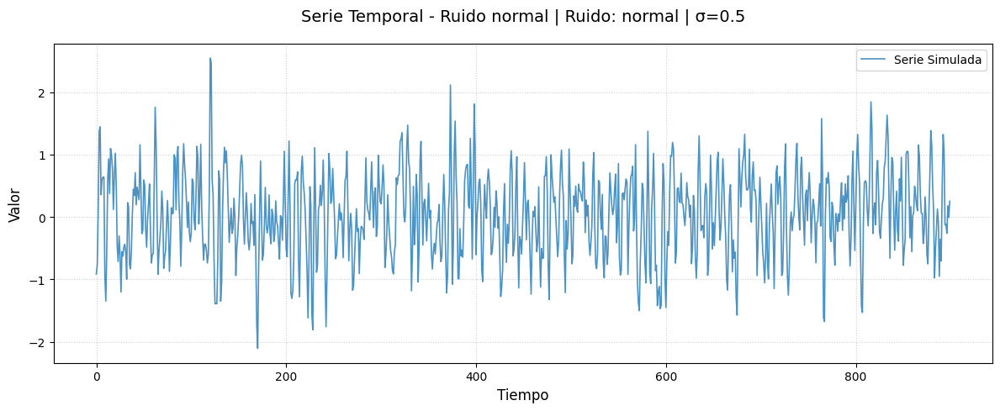

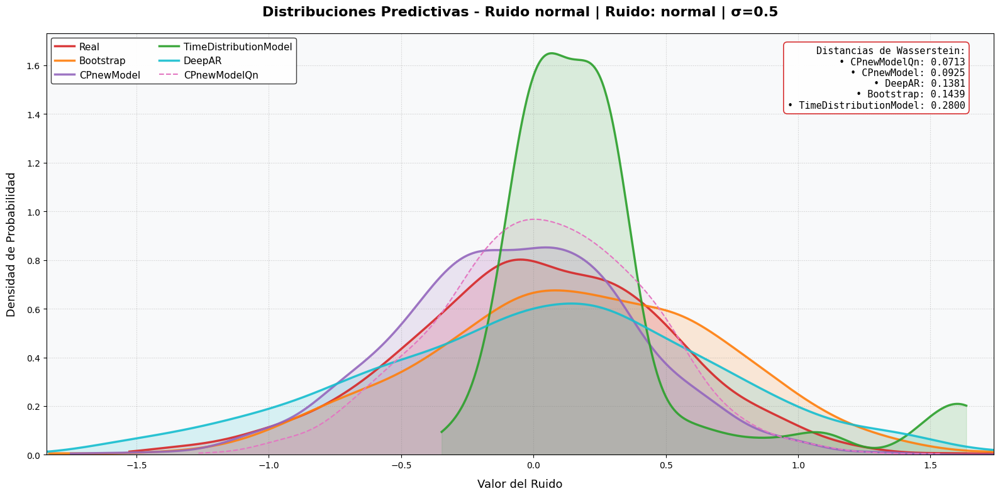

═══════════════════════════════════════════════════════
Configuración Óptima de Hiperparámetros:


,n_lags,rho,poly_degree,alpha,hidden_size,num_layers,dropout,lr
Modelo,,,,,,,,
Bootstrap,1,nan,nan,nan,nan,nan,nan,nan
CPnewModel,8,0.97,3.000000,nan,nan,nan,nan,nan
CPnewModelQn,7,0.96,1.000000,nan,nan,nan,nan,nan
TimeDistributionModel,1,0.77,nan,1.8e-06,nan,nan,nan,nan
DeepAR,1,nan,nan,nan,5.000000,2.000000,0.243524,0.088977


═══════════════════════════════════════════════════════
Comparativa de Rendimiento:


,Modelo,Wasserstein
2,CPnewModelQn,0.0713
1,CPnewModel,0.0925
4,DeepAR,0.1381
0,Bootstrap,0.1439
3,TimeDistributionModel,0.2800


##################################################
Escenario 2/24: Ruido uniform
##################################################

============================== Bootstrap ==============================
✅ Mejor n_lags encontrado: 1 (Wasserstein = 0.1891)

============================== CPnewModel ==============================
✅ Optimización exitosa:
  • Lags: 6
  • Rho: 0.704
  • Grado polinomial: 2
  • Distancia de Wasserstein: 0.7426

============================== CPnewModelQn ==============================

✅ Optimización exitosa:
  • Lags: 5
  • Rho: 0.929
  • Grado polinomial: 3
  • Distancia de Wasserstein: 0.1087

============================== TimeDistributionModel ==============================
✅ Optimización final: n_lags=12, rho=0.990, alpha=5.62e-02
Distancia de Wasserstein: 0.0953

============================== DeepAR ==============================
✅ Optimización DeepAR Exitosa:
  • Lags: 6
  • Hidden Size: 28
  • Capas LSTM: 1
  • Dropout: 0.187
  • Learning Rate: 0.

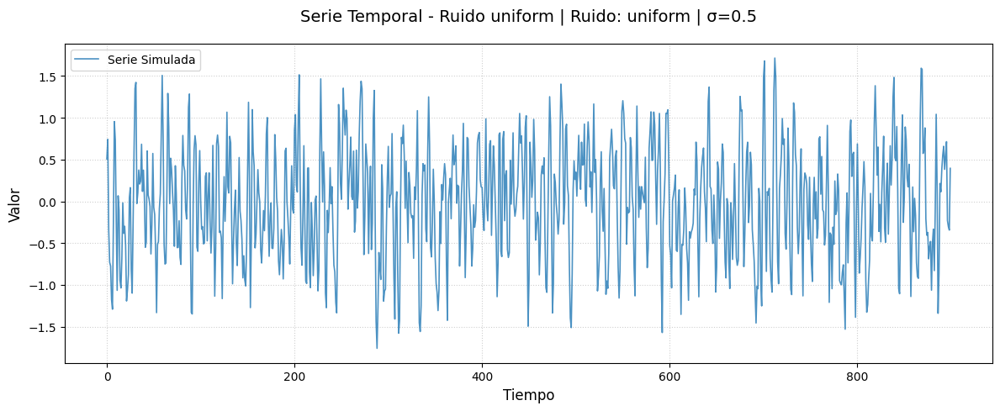

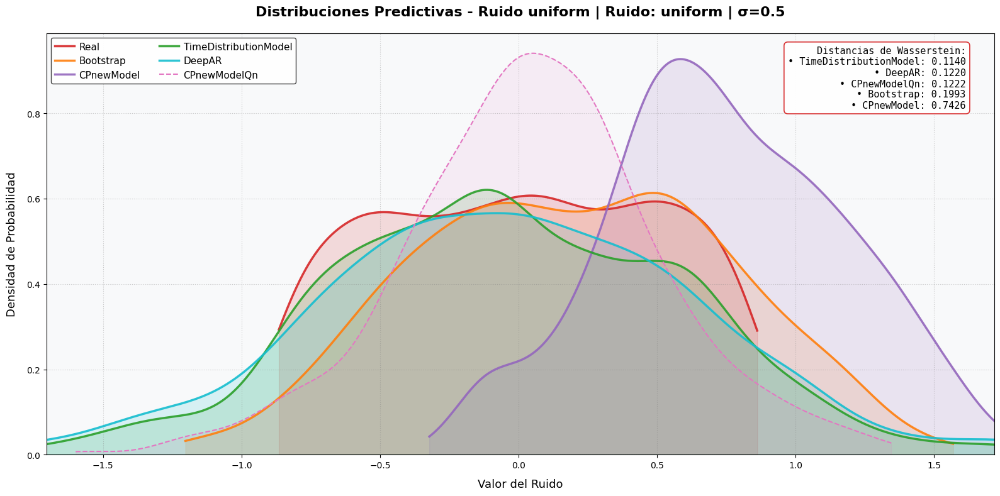

═══════════════════════════════════════════════════════
Configuración Óptima de Hiperparámetros:


,n_lags,rho,poly_degree,alpha,hidden_size,num_layers,dropout,lr
Modelo,,,,,,,,
Bootstrap,1,nan,nan,nan,nan,nan,nan,nan
CPnewModel,6,0.70,2.000000,nan,nan,nan,nan,nan
CPnewModelQn,5,0.93,3.000000,nan,nan,nan,nan,nan
TimeDistributionModel,12,0.99,nan,5.6e-02,nan,nan,nan,nan
DeepAR,6,nan,nan,nan,28.000000,1.000000,0.187270,0.073467


═══════════════════════════════════════════════════════
Comparativa de Rendimiento:


,Modelo,Wasserstein
3,TimeDistributionModel,0.1140
4,DeepAR,0.1220
2,CPnewModelQn,0.1222
0,Bootstrap,0.1993
1,CPnewModel,0.7426


##################################################
Escenario 3/24: Ruido t
##################################################

============================== Bootstrap ==============================
✅ Mejor n_lags encontrado: 4 (Wasserstein = 0.0485)

============================== CPnewModel ==============================
✅ Optimización exitosa:
  • Lags: 1
  • Rho: 0.700
  • Grado polinomial: 2
  • Distancia de Wasserstein: 0.8213

============================== CPnewModelQn ==============================

✅ Optimización exitosa:
  • Lags: 5
  • Rho: 0.956
  • Grado polinomial: 2
  • Distancia de Wasserstein: 0.0659

============================== TimeDistributionModel ==============================
✅ Optimización final: n_lags=7, rho=0.936, alpha=5.62e-02
Distancia de Wasserstein: 0.2315

============================== DeepAR ==============================
✅ Optimización DeepAR Exitosa:
  • Lags: 2
  • Hidden Size: 29
  • Capas LSTM: 1
  • Dropout: 0.190
  • Learning Rate: 0.0305


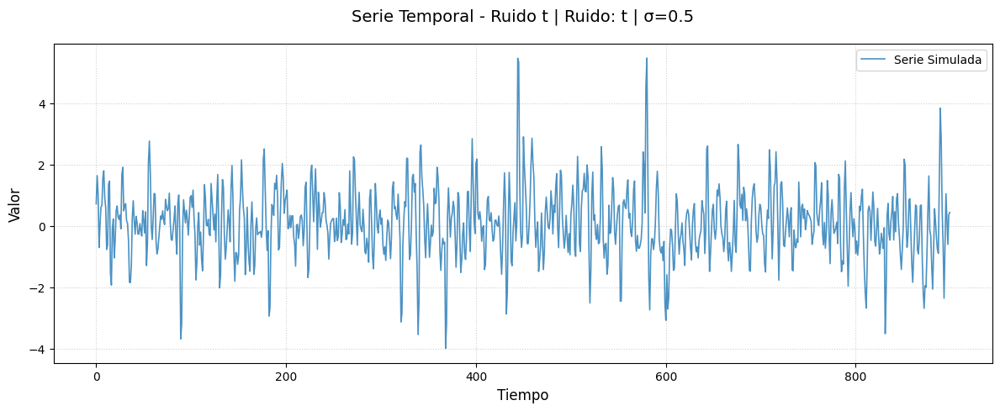

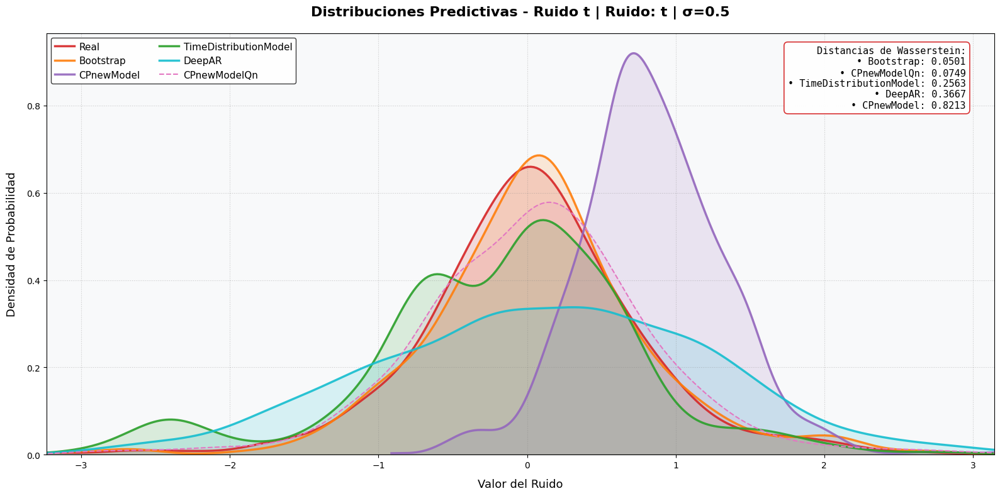

═══════════════════════════════════════════════════════
Configuración Óptima de Hiperparámetros:


,n_lags,rho,poly_degree,alpha,hidden_size,num_layers,dropout,lr
Modelo,,,,,,,,
Bootstrap,4,nan,nan,nan,nan,nan,nan,nan
CPnewModel,1,0.70,2.000000,nan,nan,nan,nan,nan
CPnewModelQn,5,0.96,2.000000,nan,nan,nan,nan,nan
TimeDistributionModel,7,0.94,nan,5.6e-02,nan,nan,nan,nan
DeepAR,2,nan,nan,nan,29.000000,1.000000,0.189592,0.030480


═══════════════════════════════════════════════════════
Comparativa de Rendimiento:


,Modelo,Wasserstein
0,Bootstrap,0.0501
2,CPnewModelQn,0.0749
3,TimeDistributionModel,0.2563
4,DeepAR,0.3667
1,CPnewModel,0.8213


##################################################
Escenario 4/24: Ruido exponential
##################################################

============================== Bootstrap ==============================
✅ Mejor n_lags encontrado: 1 (Wasserstein = 0.1338)

============================== CPnewModel ==============================
✅ Optimización exitosa:
  • Lags: 8
  • Rho: 0.700
  • Grado polinomial: 2
  • Distancia de Wasserstein: 0.3082

============================== CPnewModelQn ==============================

✅ Optimización exitosa:
  • Lags: 8
  • Rho: 0.965
  • Grado polinomial: 2
  • Distancia de Wasserstein: 0.0862

============================== TimeDistributionModel ==============================
✅ Optimización final: n_lags=5, rho=0.990, alpha=5.62e-02
Distancia de Wasserstein: 0.1457

============================== DeepAR ==============================
✅ Optimización DeepAR Exitosa:
  • Lags: 6
  • Hidden Size: 6
  • Capas LSTM: 2
  • Dropout: 0.078
  • Learning Rate: 

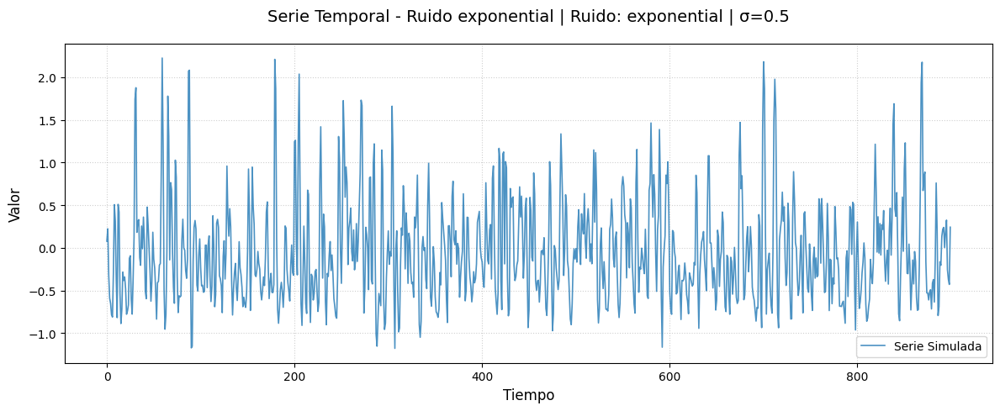

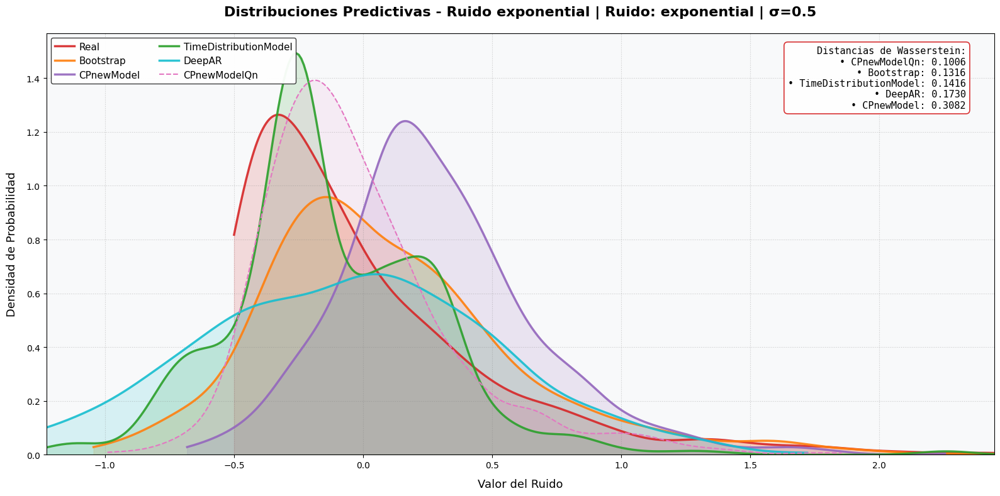

═══════════════════════════════════════════════════════
Configuración Óptima de Hiperparámetros:


,n_lags,rho,poly_degree,alpha,hidden_size,num_layers,dropout,lr
Modelo,,,,,,,,
Bootstrap,1,nan,nan,nan,nan,nan,nan,nan
CPnewModel,8,0.70,2.000000,nan,nan,nan,nan,nan
CPnewModelQn,8,0.96,2.000000,nan,nan,nan,nan,nan
TimeDistributionModel,5,0.99,nan,5.6e-02,nan,nan,nan,nan
DeepAR,6,nan,nan,nan,6.000000,2.000000,0.077997,0.086751


═══════════════════════════════════════════════════════
Comparativa de Rendimiento:


,Modelo,Wasserstein
2,CPnewModelQn,0.1006
0,Bootstrap,0.1316
3,TimeDistributionModel,0.1416
4,DeepAR,0.1730
1,CPnewModel,0.3082


##################################################
Escenario 5/24: Cambio gradual AR
##################################################

============================== Bootstrap ==============================
✅ Mejor n_lags encontrado: 9 (Wasserstein = 24.9646)

============================== CPnewModel ==============================
✅ Optimización exitosa:
  • Lags: 1
  • Rho: 0.837
  • Grado polinomial: 1
  • Distancia de Wasserstein: 25.1951

============================== CPnewModelQn ==============================

✅ Optimización exitosa:
  • Lags: 7
  • Rho: 0.631
  • Grado polinomial: 1
  • Distancia de Wasserstein: 8.9767

============================== TimeDistributionModel ==============================
✅ Optimización final: n_lags=1, rho=0.718, alpha=1.00e-08
Distancia de Wasserstein: 25.4992

============================== DeepAR ==============================
✅ Optimización DeepAR Exitosa:
  • Lags: 6
  • Hidden Size: 28
  • Capas LSTM: 1
  • Dropout: 0.187
  • Learning Ra

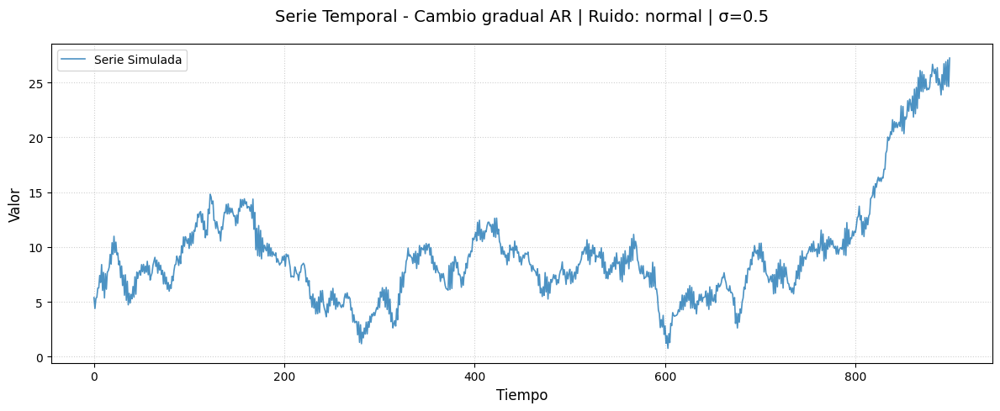

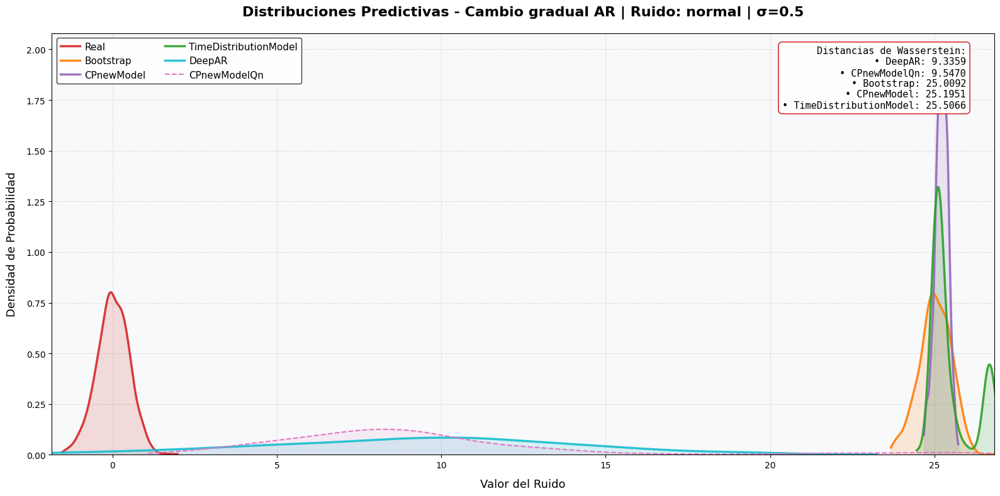

═══════════════════════════════════════════════════════
Configuración Óptima de Hiperparámetros:


,n_lags,rho,poly_degree,alpha,hidden_size,num_layers,dropout,lr
Modelo,,,,,,,,
Bootstrap,9,nan,nan,nan,nan,nan,nan,nan
CPnewModel,1,0.84,1.000000,nan,nan,nan,nan,nan
CPnewModelQn,7,0.63,1.000000,nan,nan,nan,nan,nan
TimeDistributionModel,1,0.72,nan,1.0e-08,nan,nan,nan,nan
DeepAR,6,nan,nan,nan,28.000000,1.000000,0.187270,0.073467


═══════════════════════════════════════════════════════
Comparativa de Rendimiento:


,Modelo,Wasserstein
4,DeepAR,9.3359
2,CPnewModelQn,9.5470
0,Bootstrap,25.0092
1,CPnewModel,25.1951
3,TimeDistributionModel,25.5066


##################################################
Escenario 6/24: Cambio brusco MA
##################################################

============================== Bootstrap ==============================
✅ Mejor n_lags encontrado: 3 (Wasserstein = 0.1150)

============================== CPnewModel ==============================
✅ Optimización exitosa:
  • Lags: 2
  • Rho: 0.720
  • Grado polinomial: 3
  • Distancia de Wasserstein: 0.5312

============================== CPnewModelQn ==============================

✅ Optimización exitosa:
  • Lags: 3
  • Rho: 0.908
  • Grado polinomial: 1
  • Distancia de Wasserstein: 0.0589

============================== TimeDistributionModel ==============================
✅ Optimización final: n_lags=5, rho=0.990, alpha=1.00e+01
Distancia de Wasserstein: 0.2370

============================== DeepAR ==============================
✅ Optimización DeepAR Exitosa:
  • Lags: 6
  • Hidden Size: 28
  • Capas LSTM: 1
  • Dropout: 0.261
  • Learning Rate: 

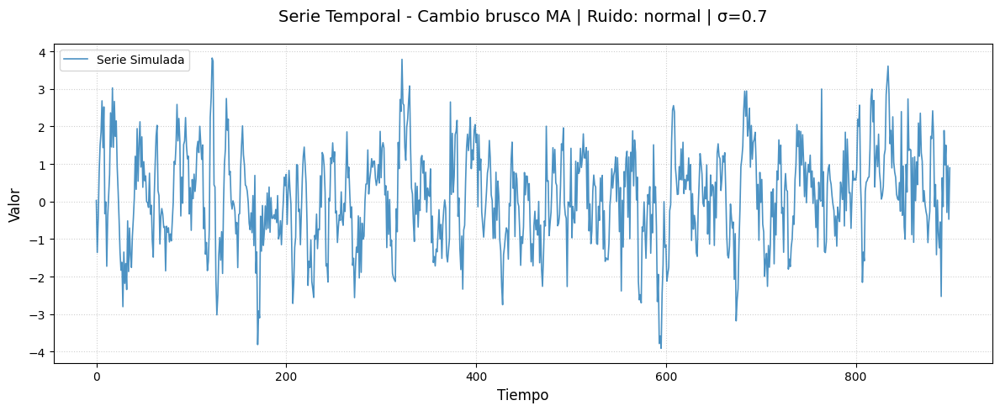

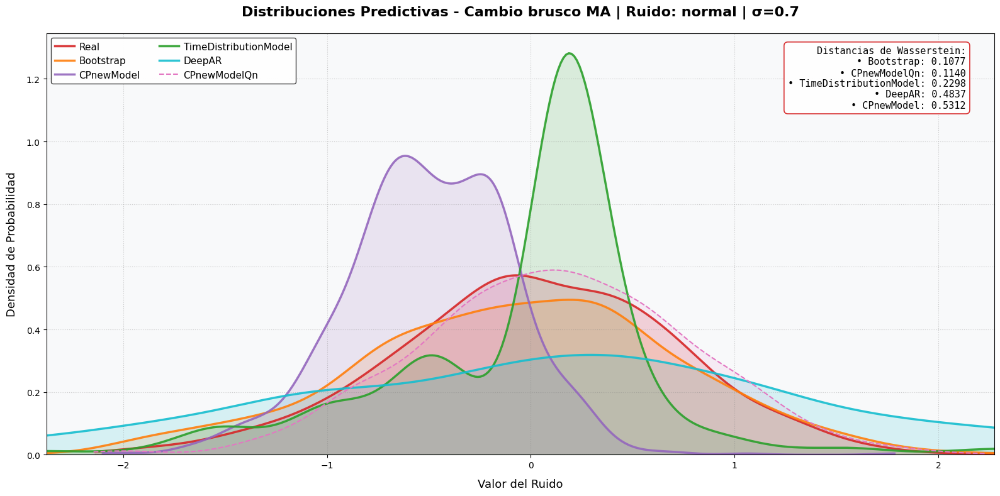

═══════════════════════════════════════════════════════
Configuración Óptima de Hiperparámetros:


,n_lags,rho,poly_degree,alpha,hidden_size,num_layers,dropout,lr
Modelo,,,,,,,,
Bootstrap,3,nan,nan,nan,nan,nan,nan,nan
CPnewModel,2,0.72,3.000000,nan,nan,nan,nan,nan
CPnewModelQn,3,0.91,1.000000,nan,nan,nan,nan,nan
TimeDistributionModel,5,0.99,nan,1.0e+01,nan,nan,nan,nan
DeepAR,6,nan,nan,nan,28.000000,1.000000,0.260965,0.060786


═══════════════════════════════════════════════════════
Comparativa de Rendimiento:


,Modelo,Wasserstein
0,Bootstrap,0.1077
2,CPnewModelQn,0.1140
3,TimeDistributionModel,0.2298
4,DeepAR,0.4837
1,CPnewModel,0.5312


##################################################
Escenario 7/24: Cambio mixto ARMA
##################################################

============================== Bootstrap ==============================
✅ Mejor n_lags encontrado: 9 (Wasserstein = 0.2120)

============================== CPnewModel ==============================
✅ Optimización exitosa:
  • Lags: 1
  • Rho: 0.742
  • Grado polinomial: 1
  • Distancia de Wasserstein: 0.2531

============================== CPnewModelQn ==============================

✅ Optimización exitosa:
  • Lags: 8
  • Rho: 0.837
  • Grado polinomial: 1
  • Distancia de Wasserstein: 0.0660

============================== TimeDistributionModel ==============================
✅ Optimización final: n_lags=2, rho=0.500, alpha=1.00e-08
Distancia de Wasserstein: 0.2480

============================== DeepAR ==============================
✅ Optimización DeepAR Exitosa:
  • Lags: 6
  • Hidden Size: 6
  • Capas LSTM: 2
  • Dropout: 0.078
  • Learning Rate: 

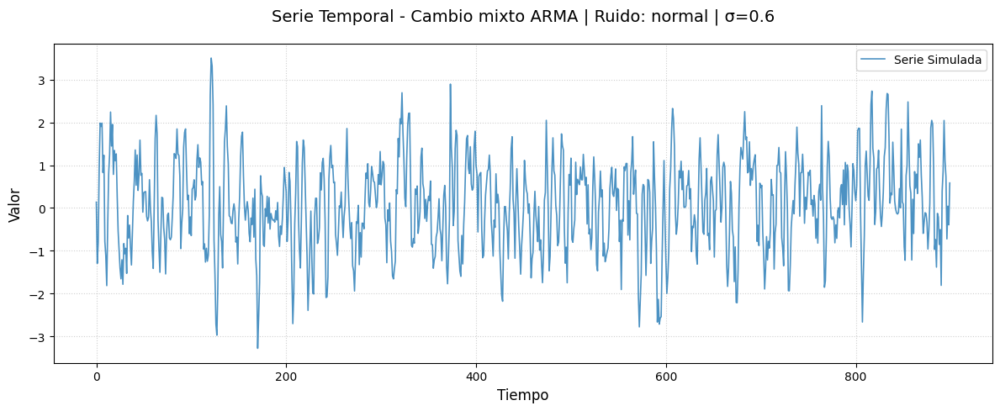

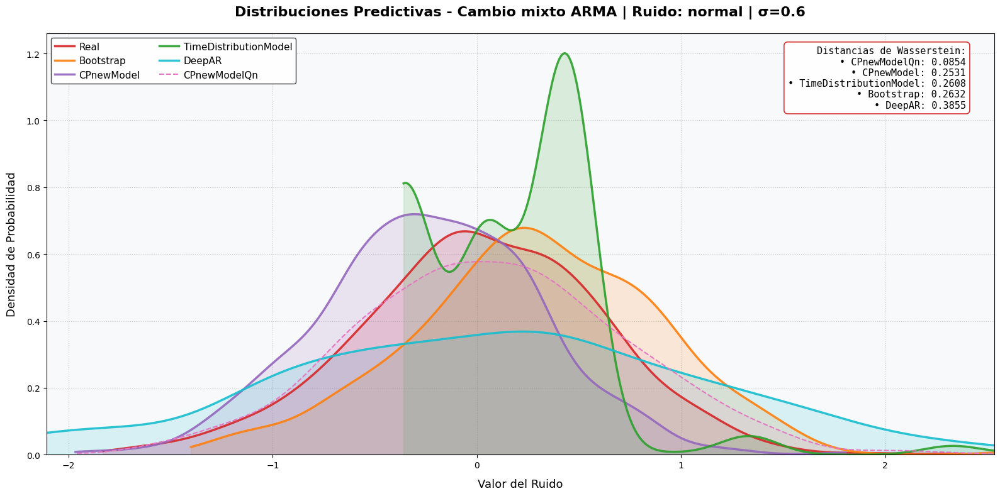

═══════════════════════════════════════════════════════
Configuración Óptima de Hiperparámetros:


,n_lags,rho,poly_degree,alpha,hidden_size,num_layers,dropout,lr
Modelo,,,,,,,,
Bootstrap,9,nan,nan,nan,nan,nan,nan,nan
CPnewModel,1,0.74,1.000000,nan,nan,nan,nan,nan
CPnewModelQn,8,0.84,1.000000,nan,nan,nan,nan,nan
TimeDistributionModel,2,0.50,nan,1.0e-08,nan,nan,nan,nan
DeepAR,6,nan,nan,nan,6.000000,2.000000,0.077997,0.086751


═══════════════════════════════════════════════════════
Comparativa de Rendimiento:


,Modelo,Wasserstein
2,CPnewModelQn,0.0854
1,CPnewModel,0.2531
3,TimeDistributionModel,0.2608
0,Bootstrap,0.2632
4,DeepAR,0.3855


##################################################
Escenario 8/24: Estacionalidad diaria
##################################################

============================== Bootstrap ==============================
✅ Mejor n_lags encontrado: 1 (Wasserstein = 0.6189)

============================== CPnewModel ==============================
✅ Optimización exitosa:
  • Lags: 8
  • Rho: 0.973
  • Grado polinomial: 3
  • Distancia de Wasserstein: 0.6031

============================== CPnewModelQn ==============================

✅ Optimización exitosa:
  • Lags: 8
  • Rho: 0.828
  • Grado polinomial: 2
  • Distancia de Wasserstein: 0.3340

============================== TimeDistributionModel ==============================
✅ Optimización final: n_lags=1, rho=0.718, alpha=3.16e-04
Distancia de Wasserstein: 0.7319

============================== DeepAR ==============================
✅ Optimización DeepAR Exitosa:
  • Lags: 9
  • Hidden Size: 13
  • Capas LSTM: 1
  • Dropout: 0.252
  • Learning R

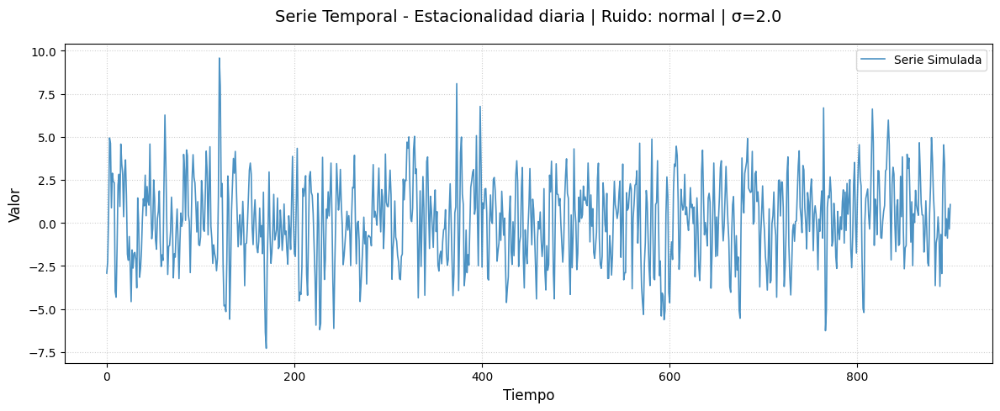

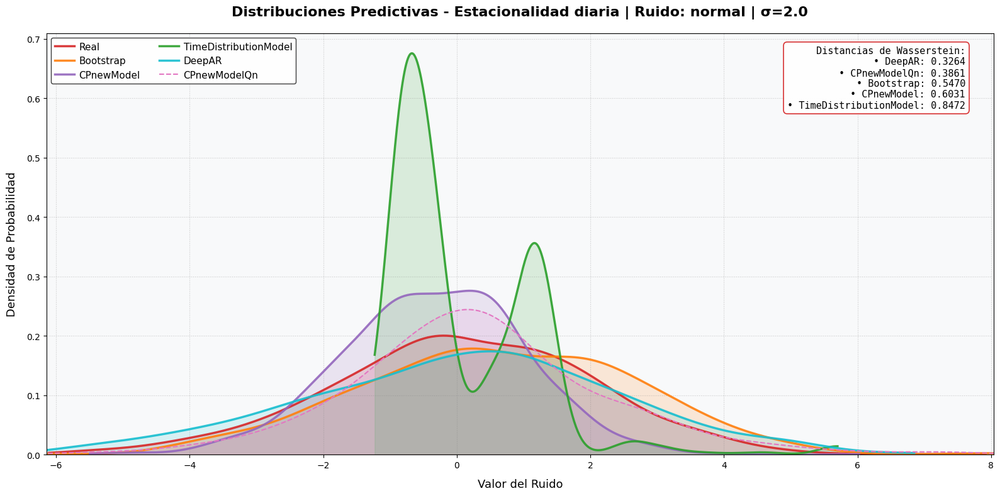

═══════════════════════════════════════════════════════
Configuración Óptima de Hiperparámetros:


,n_lags,rho,poly_degree,alpha,hidden_size,num_layers,dropout,lr
Modelo,,,,,,,,
Bootstrap,1,nan,nan,nan,nan,nan,nan,nan
CPnewModel,8,0.97,3.000000,nan,nan,nan,nan,nan
CPnewModelQn,8,0.83,2.000000,nan,nan,nan,nan,nan
TimeDistributionModel,1,0.72,nan,3.2e-04,nan,nan,nan,nan
DeepAR,9,nan,nan,nan,13.000000,1.000000,0.251702,0.066621


═══════════════════════════════════════════════════════
Comparativa de Rendimiento:


,Modelo,Wasserstein
4,DeepAR,0.3264
2,CPnewModelQn,0.3861
0,Bootstrap,0.5470
1,CPnewModel,0.6031
3,TimeDistributionModel,0.8472


##################################################
Escenario 9/24: Estacionalidad anual
##################################################

============================== Bootstrap ==============================
✅ Mejor n_lags encontrado: 1 (Wasserstein = 0.9284)

============================== CPnewModel ==============================
✅ Optimización exitosa:
  • Lags: 8
  • Rho: 0.973
  • Grado polinomial: 3
  • Distancia de Wasserstein: 0.9047

============================== CPnewModelQn ==============================

✅ Optimización exitosa:
  • Lags: 8
  • Rho: 0.828
  • Grado polinomial: 2
  • Distancia de Wasserstein: 0.5010

============================== TimeDistributionModel ==============================
✅ Optimización final: n_lags=1, rho=0.718, alpha=3.16e-04
Distancia de Wasserstein: 1.0978

============================== DeepAR ==============================
✅ Optimización DeepAR Exitosa:
  • Lags: 9
  • Hidden Size: 13
  • Capas LSTM: 1
  • Dropout: 0.252
  • Learning Ra

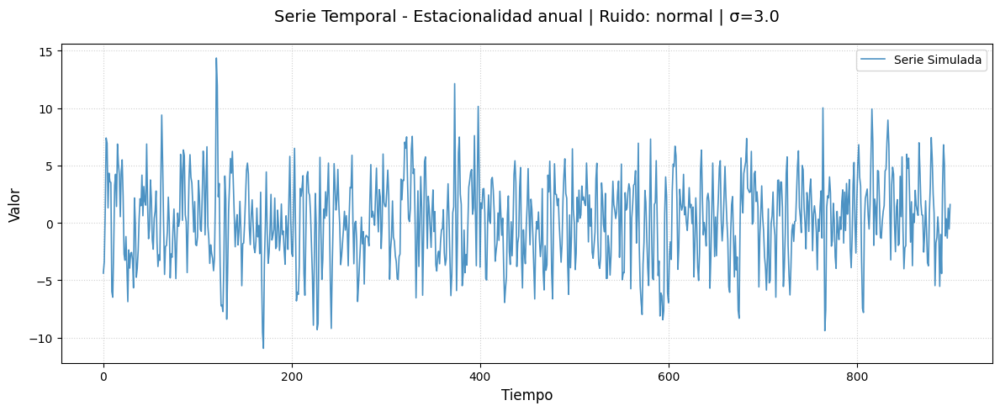

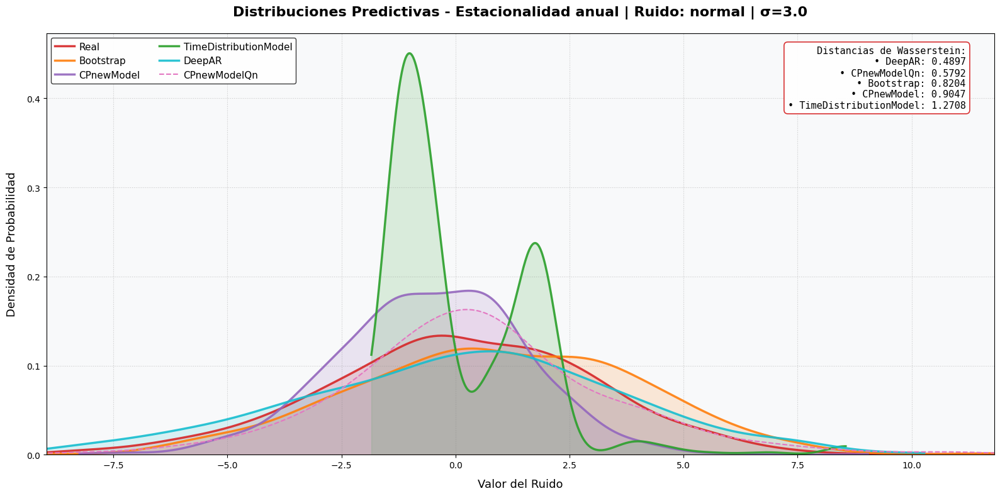

═══════════════════════════════════════════════════════
Configuración Óptima de Hiperparámetros:


,n_lags,rho,poly_degree,alpha,hidden_size,num_layers,dropout,lr
Modelo,,,,,,,,
Bootstrap,1,nan,nan,nan,nan,nan,nan,nan
CPnewModel,8,0.97,3.000000,nan,nan,nan,nan,nan
CPnewModelQn,8,0.83,2.000000,nan,nan,nan,nan,nan
TimeDistributionModel,1,0.72,nan,3.2e-04,nan,nan,nan,nan
DeepAR,9,nan,nan,nan,13.000000,1.000000,0.251702,0.066621


═══════════════════════════════════════════════════════
Comparativa de Rendimiento:


,Modelo,Wasserstein
4,DeepAR,0.4897
2,CPnewModelQn,0.5792
0,Bootstrap,0.8204
1,CPnewModel,0.9047
3,TimeDistributionModel,1.2708


##################################################
Escenario 10/24: Estacionalidad compleja
##################################################

============================== Bootstrap ==============================
✅ Mejor n_lags encontrado: 1 (Wasserstein = 0.7737)

============================== CPnewModel ==============================
✅ Optimización exitosa:
  • Lags: 8
  • Rho: 0.973
  • Grado polinomial: 3
  • Distancia de Wasserstein: 0.7539

============================== CPnewModelQn ==============================

✅ Optimización exitosa:
  • Lags: 8
  • Rho: 0.828
  • Grado polinomial: 2
  • Distancia de Wasserstein: 0.4175

============================== TimeDistributionModel ==============================
✅ Optimización final: n_lags=1, rho=0.718, alpha=3.16e-04
Distancia de Wasserstein: 0.9148

============================== DeepAR ==============================
✅ Optimización DeepAR Exitosa:
  • Lags: 9
  • Hidden Size: 13
  • Capas LSTM: 1
  • Dropout: 0.252
  • Learnin

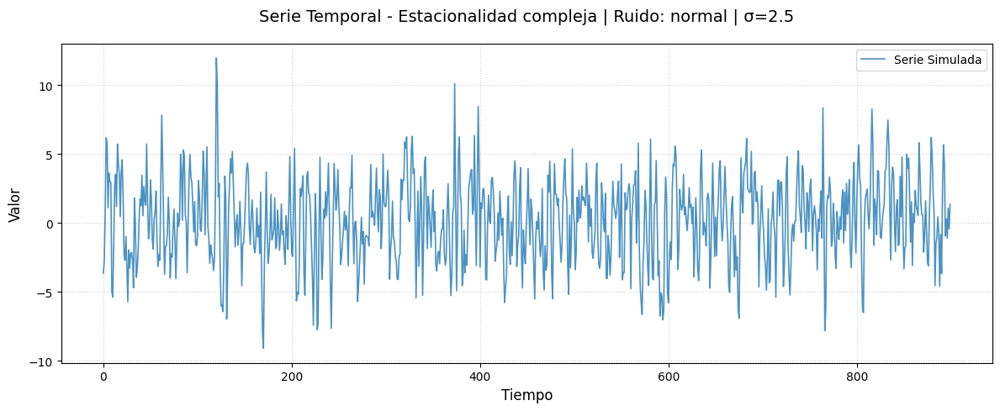

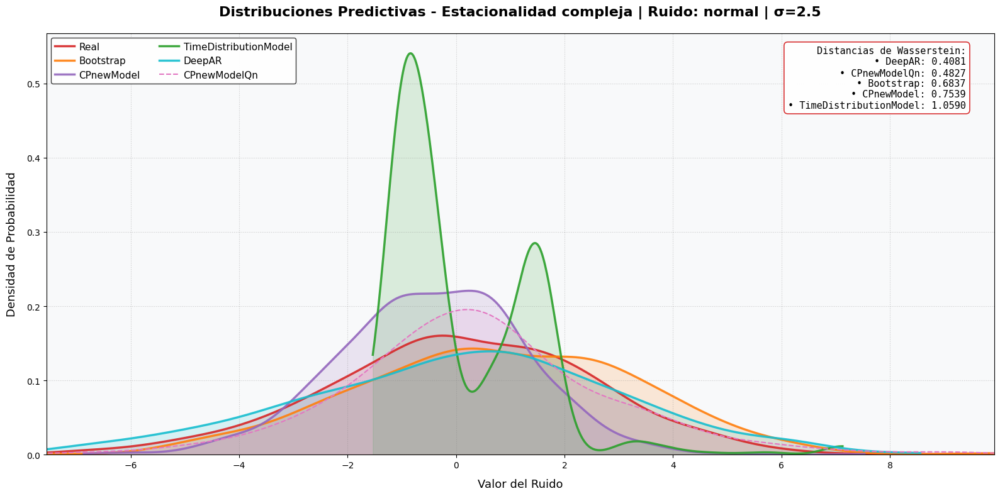

═══════════════════════════════════════════════════════
Configuración Óptima de Hiperparámetros:


,n_lags,rho,poly_degree,alpha,hidden_size,num_layers,dropout,lr
Modelo,,,,,,,,
Bootstrap,1,nan,nan,nan,nan,nan,nan,nan
CPnewModel,8,0.97,3.000000,nan,nan,nan,nan,nan
CPnewModelQn,8,0.83,2.000000,nan,nan,nan,nan,nan
TimeDistributionModel,1,0.72,nan,3.2e-04,nan,nan,nan,nan
DeepAR,9,nan,nan,nan,13.000000,1.000000,0.251702,0.066621


═══════════════════════════════════════════════════════
Comparativa de Rendimiento:


,Modelo,Wasserstein
4,DeepAR,0.4081
2,CPnewModelQn,0.4827
0,Bootstrap,0.6837
1,CPnewModel,0.7539
3,TimeDistributionModel,1.0590


##################################################
Escenario 11/24: Umbral no lineal (Z=0.5)
##################################################

============================== Bootstrap ==============================
✅ Mejor n_lags encontrado: 1 (Wasserstein = 0.1637)

============================== CPnewModel ==============================
✅ Optimización exitosa:
  • Lags: 8
  • Rho: 0.973
  • Grado polinomial: 3
  • Distancia de Wasserstein: 0.0925

============================== CPnewModelQn ==============================

✅ Optimización exitosa:
  • Lags: 7
  • Rho: 0.959
  • Grado polinomial: 1
  • Distancia de Wasserstein: 0.0815

============================== TimeDistributionModel ==============================
✅ Optimización final: n_lags=1, rho=0.772, alpha=1.78e-06
Distancia de Wasserstein: 0.2520

============================== DeepAR ==============================
✅ Optimización DeepAR Exitosa:
  • Lags: 1
  • Hidden Size: 5
  • Capas LSTM: 2
  • Dropout: 0.244
  • Learnin

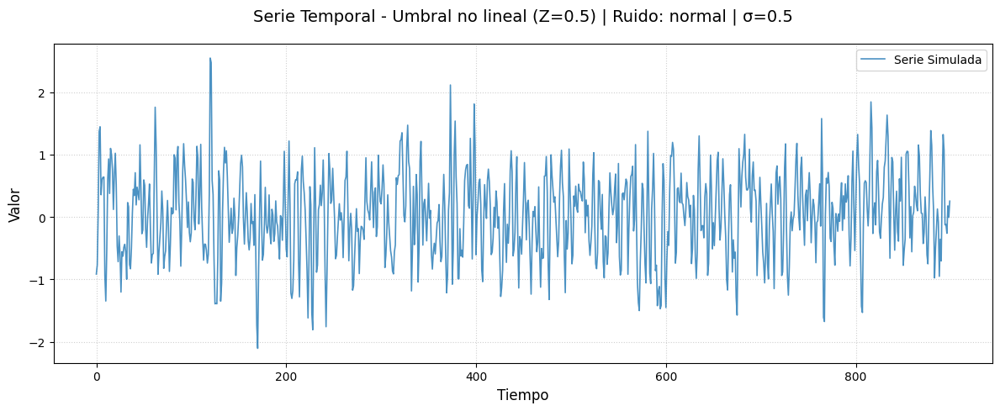

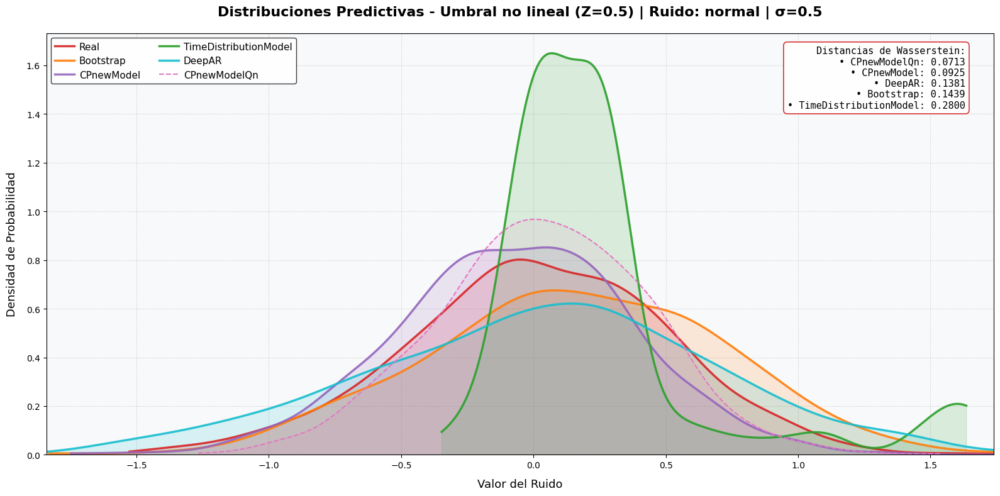

═══════════════════════════════════════════════════════
Configuración Óptima de Hiperparámetros:


,n_lags,rho,poly_degree,alpha,hidden_size,num_layers,dropout,lr
Modelo,,,,,,,,
Bootstrap,1,nan,nan,nan,nan,nan,nan,nan
CPnewModel,8,0.97,3.000000,nan,nan,nan,nan,nan
CPnewModelQn,7,0.96,1.000000,nan,nan,nan,nan,nan
TimeDistributionModel,1,0.77,nan,1.8e-06,nan,nan,nan,nan
DeepAR,1,nan,nan,nan,5.000000,2.000000,0.243524,0.088977


═══════════════════════════════════════════════════════
Comparativa de Rendimiento:


,Modelo,Wasserstein
2,CPnewModelQn,0.0713
1,CPnewModel,0.0925
4,DeepAR,0.1381
0,Bootstrap,0.1439
3,TimeDistributionModel,0.2800


##################################################
Escenario 12/24: Transformación logarítmica
##################################################
Error en Transformación logarítmica: Distribución no soportada
##################################################
Escenario 13/24: Componente cúbico
##################################################

============================== Bootstrap ==============================
✅ Mejor n_lags encontrado: 1 (Wasserstein = 0.1965)

============================== CPnewModel ==============================
✅ Optimización exitosa:
  • Lags: 8
  • Rho: 0.975
  • Grado polinomial: 3
  • Distancia de Wasserstein: 0.1106

============================== CPnewModelQn ==============================

✅ Optimización exitosa:
  • Lags: 7
  • Rho: 0.959
  • Grado polinomial: 1
  • Distancia de Wasserstein: 0.0978

============================== TimeDistributionModel ==============================
✅ Optimización final: n_lags=1, rho=0.772, alpha=1.78e-06
Distancia d

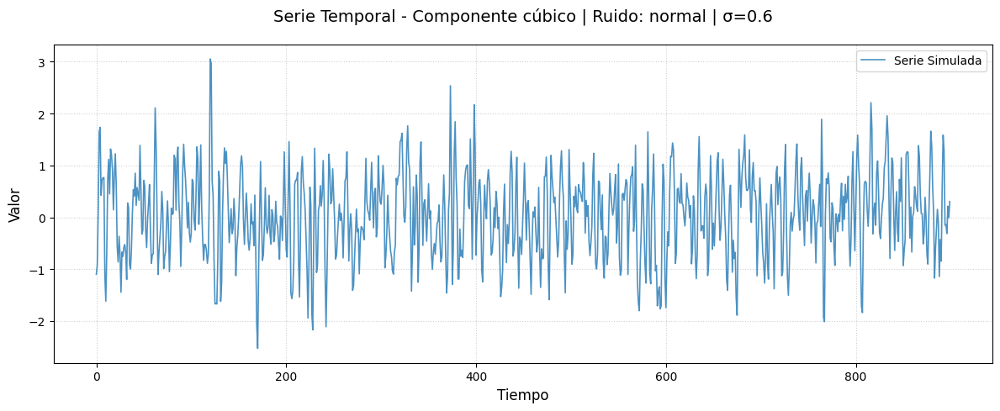

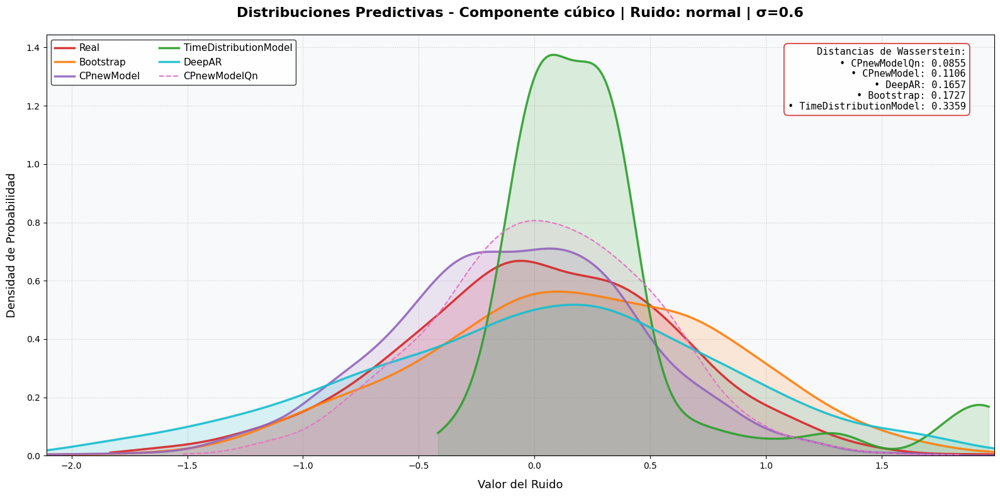

═══════════════════════════════════════════════════════
Configuración Óptima de Hiperparámetros:


,n_lags,rho,poly_degree,alpha,hidden_size,num_layers,dropout,lr
Modelo,,,,,,,,
Bootstrap,1,nan,nan,nan,nan,nan,nan,nan
CPnewModel,8,0.98,3.000000,nan,nan,nan,nan,nan
CPnewModelQn,7,0.96,1.000000,nan,nan,nan,nan,nan
TimeDistributionModel,1,0.77,nan,1.8e-06,nan,nan,nan,nan
DeepAR,1,nan,nan,nan,5.000000,2.000000,0.243524,0.088977


═══════════════════════════════════════════════════════
Comparativa de Rendimiento:


,Modelo,Wasserstein
2,CPnewModelQn,0.0855
1,CPnewModel,0.1106
4,DeepAR,0.1657
0,Bootstrap,0.1727
3,TimeDistributionModel,0.3359


##################################################
Escenario 14/24: Volatilidad moderada (GARCH)
##################################################

============================== Bootstrap ==============================
✅ Mejor n_lags encontrado: 1 (Wasserstein = 0.0438)

============================== CPnewModel ==============================
✅ Optimización exitosa:
  • Lags: 4
  • Rho: 0.946
  • Grado polinomial: 3
  • Distancia de Wasserstein: 0.0464

============================== CPnewModelQn ==============================

✅ Optimización exitosa:
  • Lags: 7
  • Rho: 0.967
  • Grado polinomial: 1
  • Distancia de Wasserstein: 0.0124

============================== TimeDistributionModel ==============================
✅ Optimización final: n_lags=1, rho=0.500, alpha=1.00e-08
Distancia de Wasserstein: 0.0833

============================== DeepAR ==============================
✅ Optimización DeepAR Exitosa:
  • Lags: 3
  • Hidden Size: 25
  • Capas LSTM: 1
  • Dropout: 0.038
  • Le

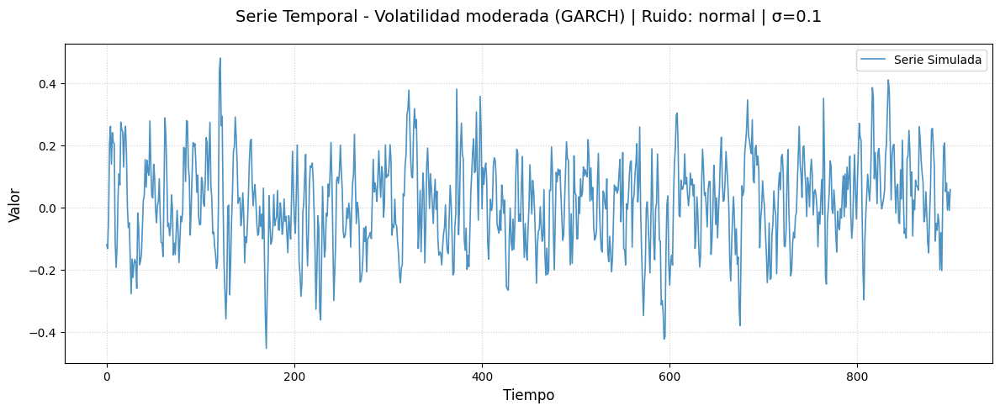

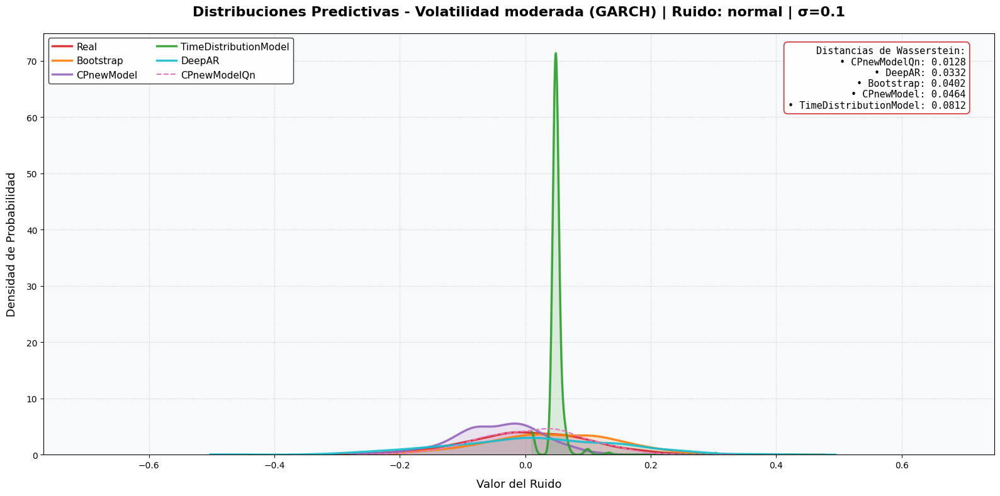

═══════════════════════════════════════════════════════
Configuración Óptima de Hiperparámetros:


,n_lags,rho,poly_degree,alpha,hidden_size,num_layers,dropout,lr
Modelo,,,,,,,,
Bootstrap,1,nan,nan,nan,nan,nan,nan,nan
CPnewModel,4,0.95,3.000000,nan,nan,nan,nan,nan
CPnewModelQn,7,0.97,1.000000,nan,nan,nan,nan,nan
TimeDistributionModel,1,0.50,nan,1.0e-08,nan,nan,nan,nan
DeepAR,3,nan,nan,nan,25.000000,1.000000,0.037732,0.047200


═══════════════════════════════════════════════════════
Comparativa de Rendimiento:


,Modelo,Wasserstein
2,CPnewModelQn,0.0128
4,DeepAR,0.0332
0,Bootstrap,0.0402
1,CPnewModel,0.0464
3,TimeDistributionModel,0.0812


##################################################
Escenario 15/24: Volatilidad explosiva (GARCH)
##################################################

============================== Bootstrap ==============================
✅ Mejor n_lags encontrado: 1 (Wasserstein = 0.1315)

============================== CPnewModel ==============================
✅ Optimización exitosa:
  • Lags: 4
  • Rho: 0.949
  • Grado polinomial: 3
  • Distancia de Wasserstein: 0.1392

============================== CPnewModelQn ==============================

✅ Optimización exitosa:
  • Lags: 7
  • Rho: 0.967
  • Grado polinomial: 1
  • Distancia de Wasserstein: 0.0371

============================== TimeDistributionModel ==============================
✅ Optimización final: n_lags=1, rho=0.936, alpha=1.00e-08
Distancia de Wasserstein: 0.0775

============================== DeepAR ==============================
✅ Optimización DeepAR Exitosa:
  • Lags: 9
  • Hidden Size: 7
  • Capas LSTM: 2
  • Dropout: 0.453
  • Le

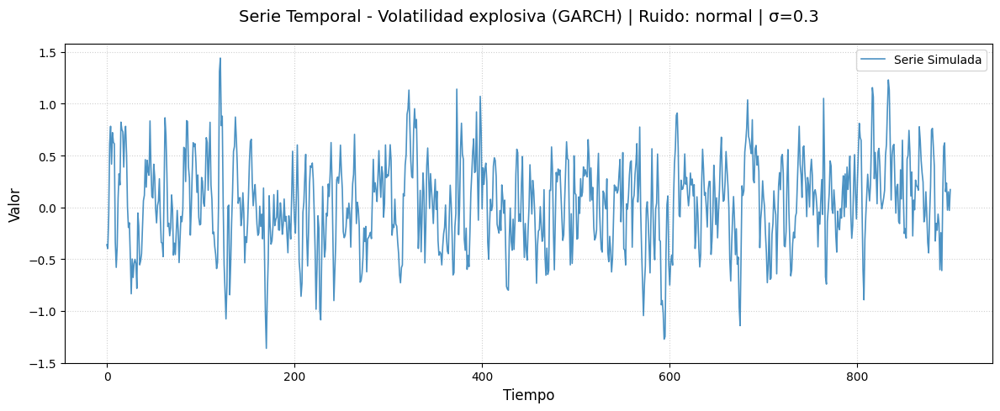

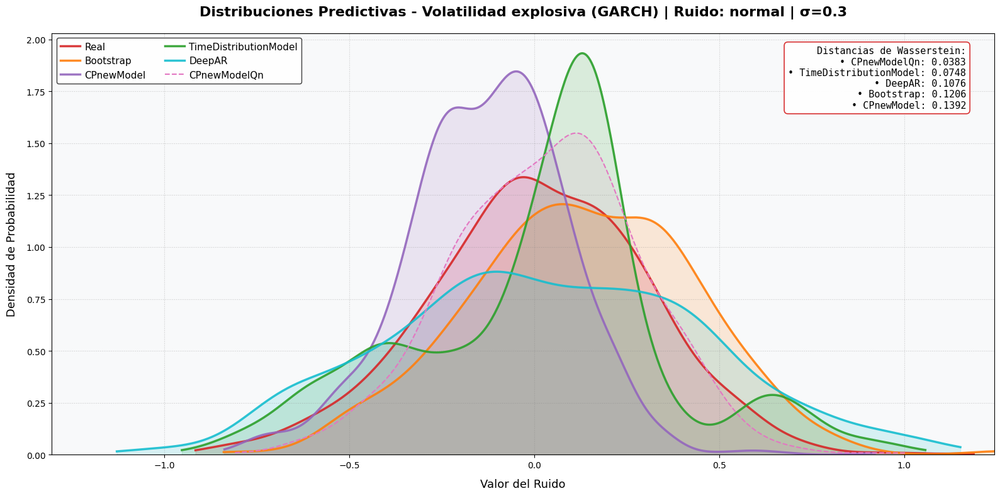

═══════════════════════════════════════════════════════
Configuración Óptima de Hiperparámetros:


,n_lags,rho,poly_degree,alpha,hidden_size,num_layers,dropout,lr
Modelo,,,,,,,,
Bootstrap,1,nan,nan,nan,nan,nan,nan,nan
CPnewModel,4,0.95,3.000000,nan,nan,nan,nan,nan
CPnewModelQn,7,0.97,1.000000,nan,nan,nan,nan,nan
TimeDistributionModel,1,0.94,nan,1.0e-08,nan,nan,nan,nan
DeepAR,9,nan,nan,nan,7.000000,2.000000,0.453191,0.015580


═══════════════════════════════════════════════════════
Comparativa de Rendimiento:


,Modelo,Wasserstein
2,CPnewModelQn,0.0383
3,TimeDistributionModel,0.0748
4,DeepAR,0.1076
0,Bootstrap,0.1206
1,CPnewModel,0.1392


##################################################
Escenario 16/24: Memoria larga (d=0.4)
##################################################

============================== Bootstrap ==============================
✅ Mejor n_lags encontrado: 9 (Wasserstein = 0.0620)

============================== CPnewModel ==============================
✅ Optimización exitosa:
  • Lags: 7
  • Rho: 0.974
  • Grado polinomial: 3
  • Distancia de Wasserstein: 0.2602

============================== CPnewModelQn ==============================

✅ Optimización exitosa:
  • Lags: 8
  • Rho: 0.859
  • Grado polinomial: 3
  • Distancia de Wasserstein: 0.1440

============================== TimeDistributionModel ==============================
✅ Optimización final: n_lags=1, rho=0.936, alpha=1.00e+01
Distancia de Wasserstein: 0.1491

============================== DeepAR ==============================
✅ Optimización DeepAR Exitosa:
  • Lags: 6
  • Hidden Size: 6
  • Capas LSTM: 2
  • Dropout: 0.274
  • Learning R

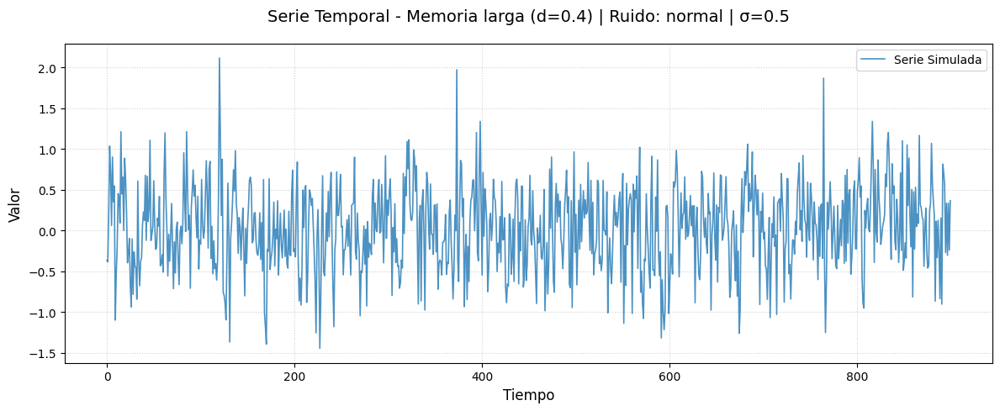

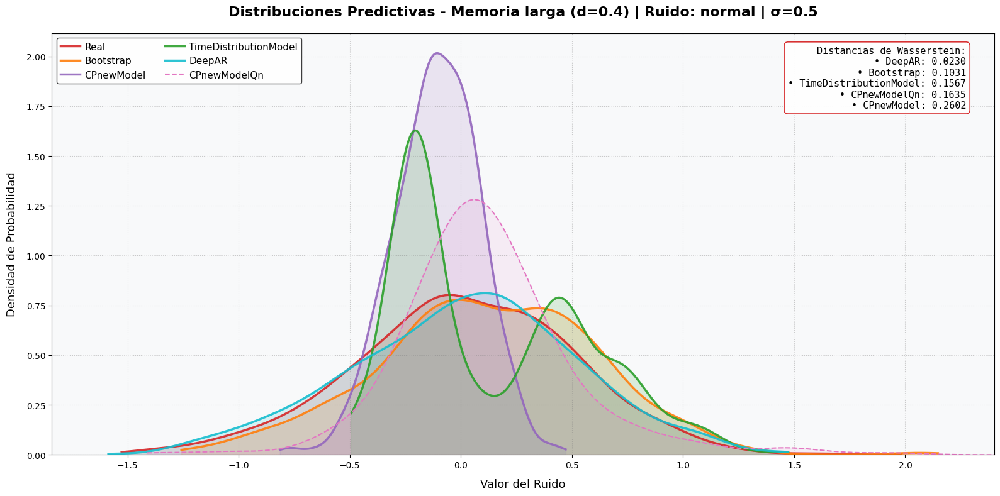

═══════════════════════════════════════════════════════
Configuración Óptima de Hiperparámetros:


,n_lags,rho,poly_degree,alpha,hidden_size,num_layers,dropout,lr
Modelo,,,,,,,,
Bootstrap,9,nan,nan,nan,nan,nan,nan,nan
CPnewModel,7,0.97,3.000000,nan,nan,nan,nan,nan
CPnewModelQn,8,0.86,3.000000,nan,nan,nan,nan,nan
TimeDistributionModel,1,0.94,nan,1.0e+01,nan,nan,nan,nan
DeepAR,6,nan,nan,nan,6.000000,2.000000,0.274210,0.076885


═══════════════════════════════════════════════════════
Comparativa de Rendimiento:


,Modelo,Wasserstein
4,DeepAR,0.0230
0,Bootstrap,0.1031
3,TimeDistributionModel,0.1567
2,CPnewModelQn,0.1635
1,CPnewModel,0.2602


##################################################
Escenario 17/24: Memoria antipersistente (d=-0.3)
##################################################

============================== Bootstrap ==============================
✅ Mejor n_lags encontrado: 9 (Wasserstein = 0.0620)

============================== CPnewModel ==============================
✅ Optimización exitosa:
  • Lags: 7
  • Rho: 0.974
  • Grado polinomial: 3
  • Distancia de Wasserstein: 0.2602

============================== CPnewModelQn ==============================

✅ Optimización exitosa:
  • Lags: 8
  • Rho: 0.859
  • Grado polinomial: 3
  • Distancia de Wasserstein: 0.1440

============================== TimeDistributionModel ==============================
✅ Optimización final: n_lags=1, rho=0.936, alpha=1.00e+01
Distancia de Wasserstein: 0.1491

============================== DeepAR ==============================
✅ Optimización DeepAR Exitosa:
  • Lags: 6
  • Hidden Size: 6
  • Capas LSTM: 2
  • Dropout: 0.274
  •

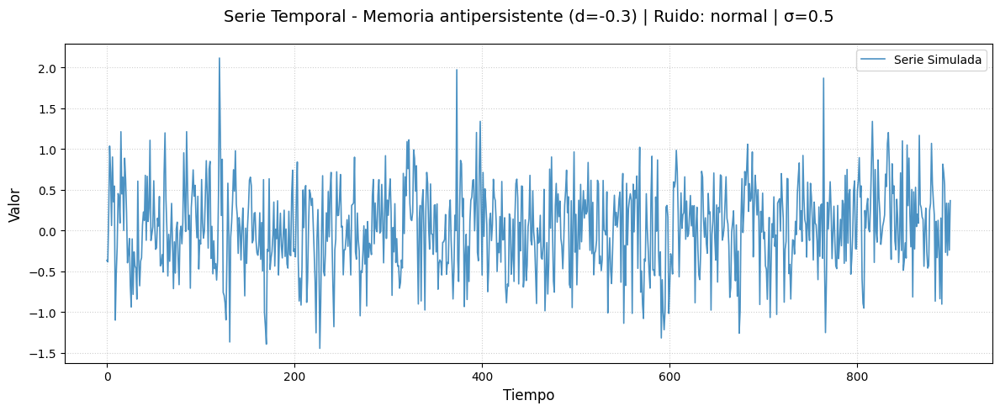

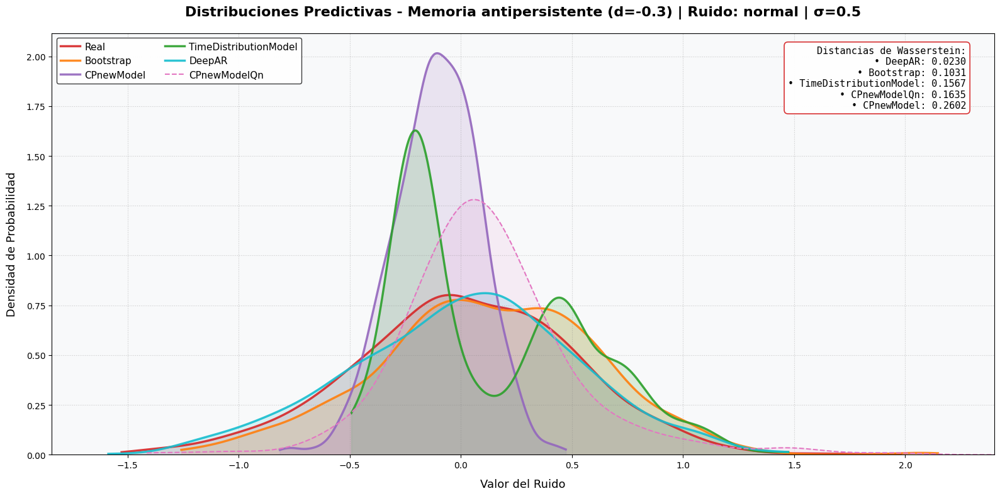

═══════════════════════════════════════════════════════
Configuración Óptima de Hiperparámetros:


,n_lags,rho,poly_degree,alpha,hidden_size,num_layers,dropout,lr
Modelo,,,,,,,,
Bootstrap,9,nan,nan,nan,nan,nan,nan,nan
CPnewModel,7,0.97,3.000000,nan,nan,nan,nan,nan
CPnewModelQn,8,0.86,3.000000,nan,nan,nan,nan,nan
TimeDistributionModel,1,0.94,nan,1.0e+01,nan,nan,nan,nan
DeepAR,6,nan,nan,nan,6.000000,2.000000,0.274210,0.076885


═══════════════════════════════════════════════════════
Comparativa de Rendimiento:


,Modelo,Wasserstein
4,DeepAR,0.0230
0,Bootstrap,0.1031
3,TimeDistributionModel,0.1567
2,CPnewModelQn,0.1635
1,CPnewModel,0.2602


##################################################
Escenario 18/24: Outliers moderados (5%)
##################################################

============================== Bootstrap ==============================
✅ Mejor n_lags encontrado: 1 (Wasserstein = 0.1637)

============================== CPnewModel ==============================
✅ Optimización exitosa:
  • Lags: 8
  • Rho: 0.973
  • Grado polinomial: 3
  • Distancia de Wasserstein: 0.0925

============================== CPnewModelQn ==============================

✅ Optimización exitosa:
  • Lags: 7
  • Rho: 0.959
  • Grado polinomial: 1
  • Distancia de Wasserstein: 0.0815

============================== TimeDistributionModel ==============================
✅ Optimización final: n_lags=1, rho=0.772, alpha=1.78e-06
Distancia de Wasserstein: 0.2520

============================== DeepAR ==============================
✅ Optimización DeepAR Exitosa:
  • Lags: 1
  • Hidden Size: 5
  • Capas LSTM: 2
  • Dropout: 0.244
  • Learning

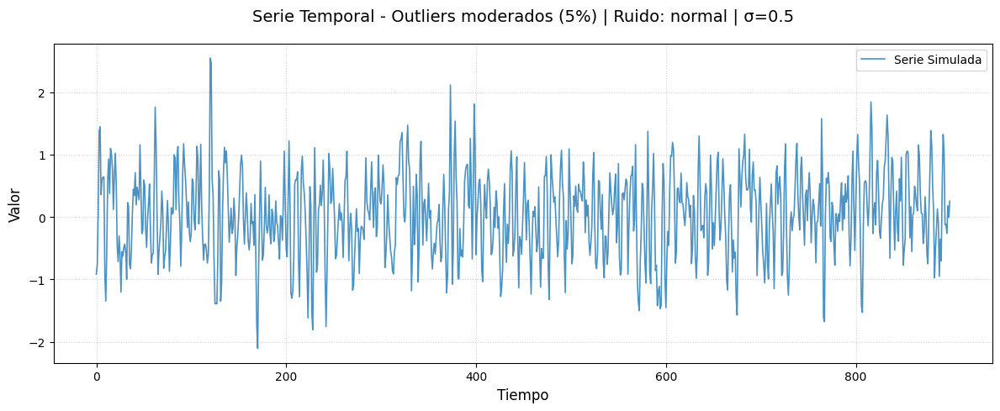

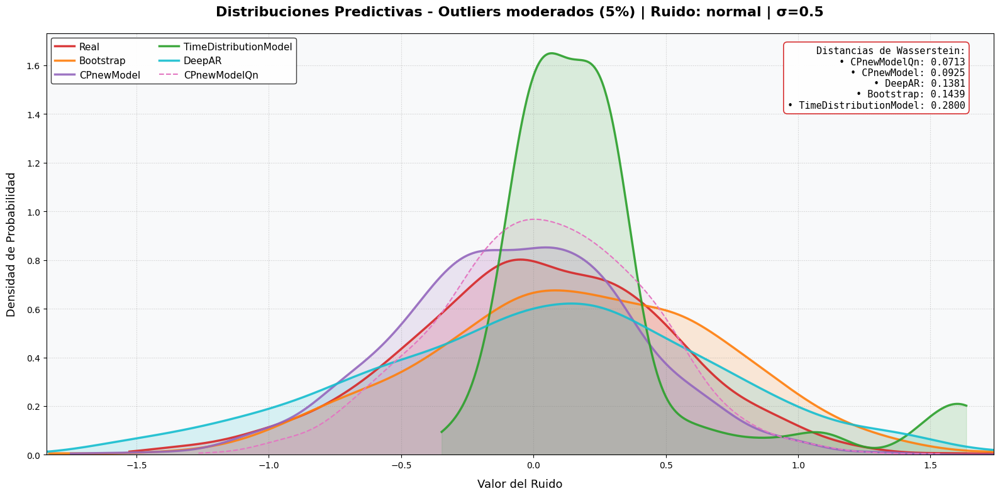

═══════════════════════════════════════════════════════
Configuración Óptima de Hiperparámetros:


,n_lags,rho,poly_degree,alpha,hidden_size,num_layers,dropout,lr
Modelo,,,,,,,,
Bootstrap,1,nan,nan,nan,nan,nan,nan,nan
CPnewModel,8,0.97,3.000000,nan,nan,nan,nan,nan
CPnewModelQn,7,0.96,1.000000,nan,nan,nan,nan,nan
TimeDistributionModel,1,0.77,nan,1.8e-06,nan,nan,nan,nan
DeepAR,1,nan,nan,nan,5.000000,2.000000,0.243524,0.088977


═══════════════════════════════════════════════════════
Comparativa de Rendimiento:


,Modelo,Wasserstein
2,CPnewModelQn,0.0713
1,CPnewModel,0.0925
4,DeepAR,0.1381
0,Bootstrap,0.1439
3,TimeDistributionModel,0.2800


##################################################
Escenario 19/24: Outliers masivos (20%)
##################################################

============================== Bootstrap ==============================
✅ Mejor n_lags encontrado: 1 (Wasserstein = 0.1637)

============================== CPnewModel ==============================
✅ Optimización exitosa:
  • Lags: 8
  • Rho: 0.973
  • Grado polinomial: 3
  • Distancia de Wasserstein: 0.0925

============================== CPnewModelQn ==============================

✅ Optimización exitosa:
  • Lags: 7
  • Rho: 0.959
  • Grado polinomial: 1
  • Distancia de Wasserstein: 0.0815

============================== TimeDistributionModel ==============================
✅ Optimización final: n_lags=1, rho=0.772, alpha=1.78e-06
Distancia de Wasserstein: 0.2520

============================== DeepAR ==============================
✅ Optimización DeepAR Exitosa:
  • Lags: 1
  • Hidden Size: 5
  • Capas LSTM: 2
  • Dropout: 0.244
  • Learning 

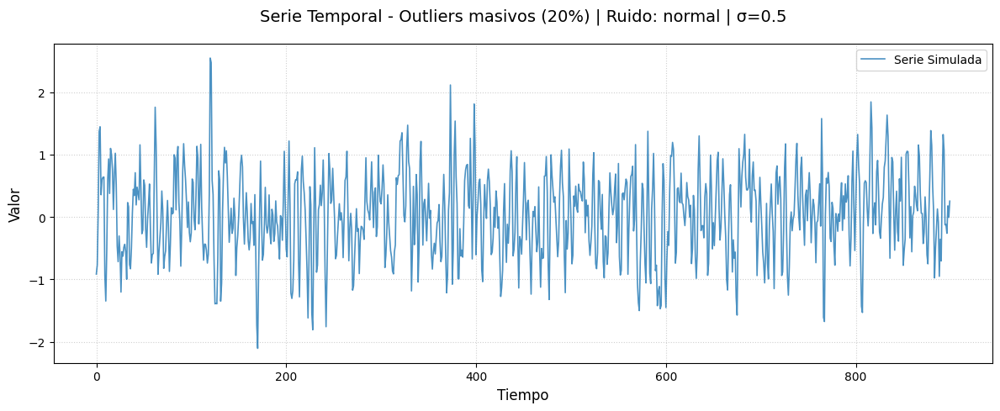

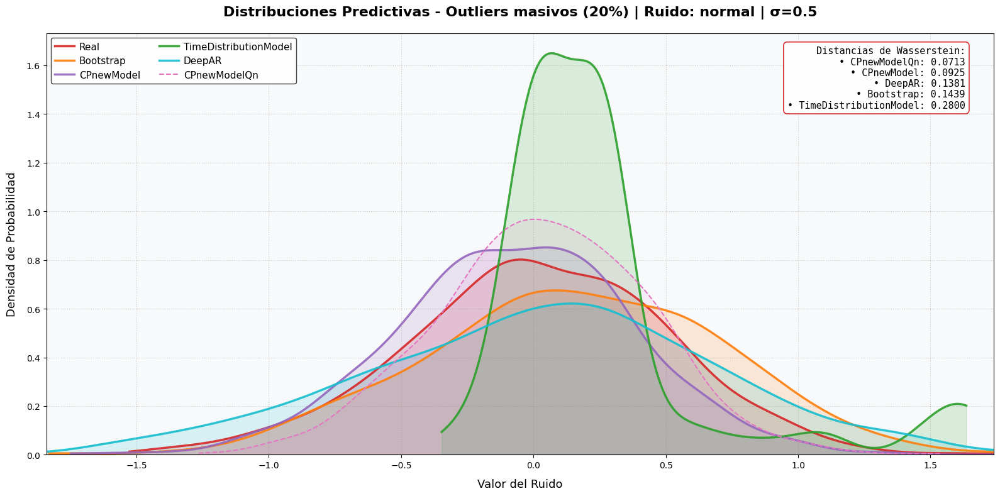

═══════════════════════════════════════════════════════
Configuración Óptima de Hiperparámetros:


,n_lags,rho,poly_degree,alpha,hidden_size,num_layers,dropout,lr
Modelo,,,,,,,,
Bootstrap,1,nan,nan,nan,nan,nan,nan,nan
CPnewModel,8,0.97,3.000000,nan,nan,nan,nan,nan
CPnewModelQn,7,0.96,1.000000,nan,nan,nan,nan,nan
TimeDistributionModel,1,0.77,nan,1.8e-06,nan,nan,nan,nan
DeepAR,1,nan,nan,nan,5.000000,2.000000,0.243524,0.088977


═══════════════════════════════════════════════════════
Comparativa de Rendimiento:


,Modelo,Wasserstein
2,CPnewModelQn,0.0713
1,CPnewModel,0.0925
4,DeepAR,0.1381
0,Bootstrap,0.1439
3,TimeDistributionModel,0.2800


##################################################
Escenario 20/24: Estrés hipervolátil (σ=5.0)
##################################################

============================== Bootstrap ==============================
✅ Mejor n_lags encontrado: 1 (Wasserstein = 5.3302)

============================== CPnewModel ==============================
✅ Optimización exitosa:
  • Lags: 1
  • Rho: 0.703
  • Grado polinomial: 2
  • Distancia de Wasserstein: 1.6629

============================== CPnewModelQn ==============================

✅ Optimización exitosa:
  • Lags: 3
  • Rho: 0.826
  • Grado polinomial: 1
  • Distancia de Wasserstein: 0.3472

============================== TimeDistributionModel ==============================
✅ Optimización final: n_lags=12, rho=0.500, alpha=1.78e-06
Distancia de Wasserstein: 3.6263

============================== DeepAR ==============================
✅ Optimización DeepAR Exitosa:
  • Lags: 6
  • Hidden Size: 28
  • Capas LSTM: 1
  • Dropout: 0.187
  • Le

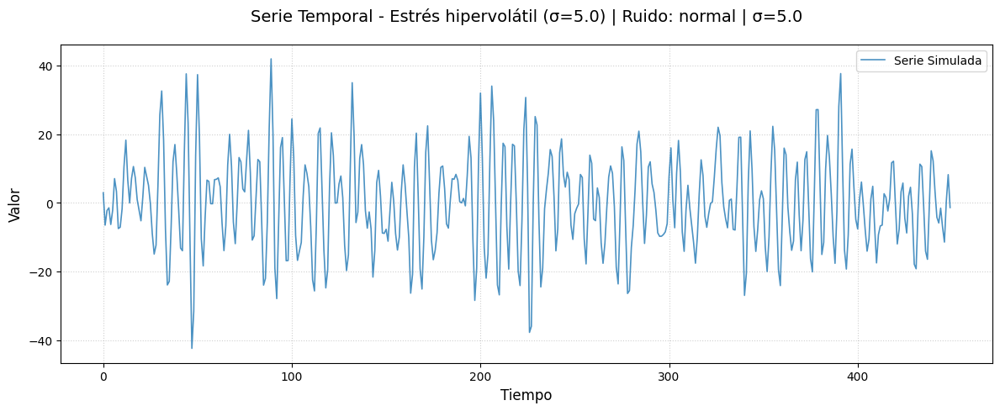

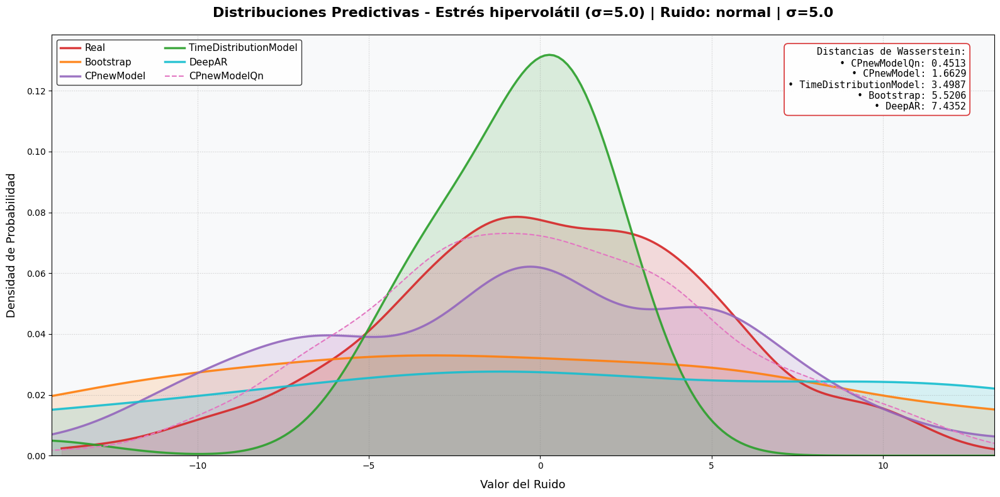

═══════════════════════════════════════════════════════
Configuración Óptima de Hiperparámetros:


,n_lags,rho,poly_degree,alpha,hidden_size,num_layers,dropout,lr
Modelo,,,,,,,,
Bootstrap,1,nan,nan,nan,nan,nan,nan,nan
CPnewModel,1,0.70,2.000000,nan,nan,nan,nan,nan
CPnewModelQn,3,0.83,1.000000,nan,nan,nan,nan,nan
TimeDistributionModel,12,0.50,nan,1.8e-06,nan,nan,nan,nan
DeepAR,6,nan,nan,nan,28.000000,1.000000,0.187270,0.073467


═══════════════════════════════════════════════════════
Comparativa de Rendimiento:


,Modelo,Wasserstein
2,CPnewModelQn,0.4513
1,CPnewModel,1.6629
3,TimeDistributionModel,3.4987
0,Bootstrap,5.5206
4,DeepAR,7.4352


##################################################
Escenario 21/24: Estrés de raíz unitaria (φ=0.99)
##################################################

============================== Bootstrap ==============================
✅ Mejor n_lags encontrado: 1 (Wasserstein = 3.0878)

============================== CPnewModel ==============================
✅ Optimización exitosa:
  • Lags: 1
  • Rho: 0.730
  • Grado polinomial: 3
  • Distancia de Wasserstein: 2.7896

============================== CPnewModelQn ==============================

✅ Optimización exitosa:
  • Lags: 3
  • Rho: 0.826
  • Grado polinomial: 1
  • Distancia de Wasserstein: 1.1065

============================== TimeDistributionModel ==============================
✅ Optimización final: n_lags=11, rho=0.663, alpha=1.00e+01
Distancia de Wasserstein: 1.2818

============================== DeepAR ==============================
✅ Optimización DeepAR Exitosa:
  • Lags: 6
  • Hidden Size: 28
  • Capas LSTM: 1
  • Dropout: 0.261
 

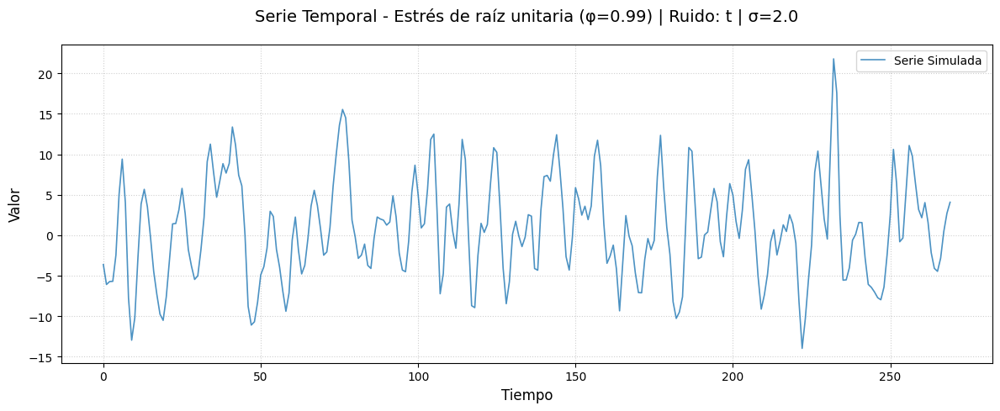

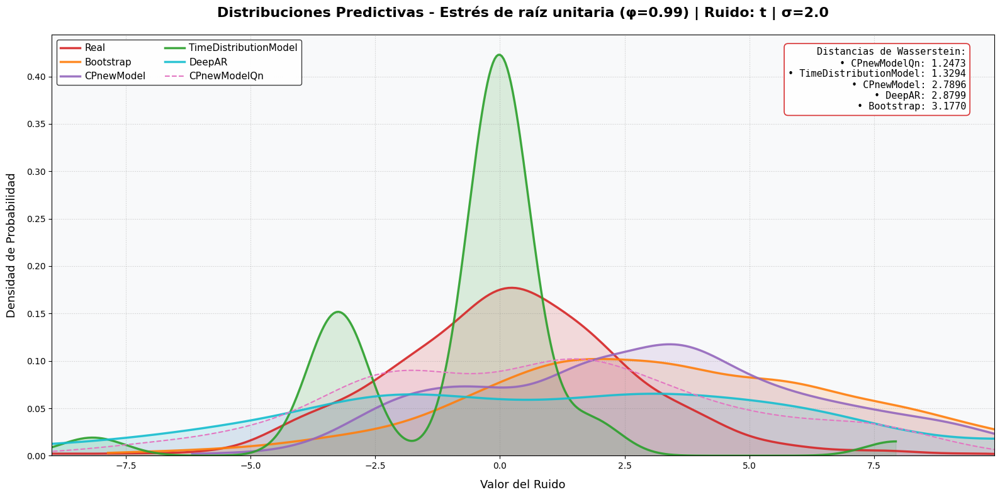

═══════════════════════════════════════════════════════
Configuración Óptima de Hiperparámetros:


,n_lags,rho,poly_degree,alpha,hidden_size,num_layers,dropout,lr
Modelo,,,,,,,,
Bootstrap,1,nan,nan,nan,nan,nan,nan,nan
CPnewModel,1,0.73,3.000000,nan,nan,nan,nan,nan
CPnewModelQn,3,0.83,1.000000,nan,nan,nan,nan,nan
TimeDistributionModel,11,0.66,nan,1.0e+01,nan,nan,nan,nan
DeepAR,6,nan,nan,nan,28.000000,1.000000,0.260965,0.060786


═══════════════════════════════════════════════════════
Comparativa de Rendimiento:


,Modelo,Wasserstein
2,CPnewModelQn,1.2473
3,TimeDistributionModel,1.3294
1,CPnewModel,2.7896
4,DeepAR,2.8799
0,Bootstrap,3.1770


##################################################
Escenario 22/24: Estrés de serie mínima (n=50)
##################################################

============================== Bootstrap ==============================
✅ Mejor n_lags encontrado: 1 (Wasserstein = 2.2539)

============================== CPnewModel ==============================
✅ Optimización exitosa:
  • Lags: 2
  • Rho: 0.733
  • Grado polinomial: 1
  • Distancia de Wasserstein: 0.3602

============================== CPnewModelQn ==============================

✅ Optimización exitosa:
  • Lags: 7
  • Rho: 0.959
  • Grado polinomial: 1
  • Distancia de Wasserstein: 0.3501

============================== TimeDistributionModel ==============================
✅ Optimización final: n_lags=5, rho=0.881, alpha=1.00e+01
Distancia de Wasserstein: 0.2964

============================== DeepAR ==============================
✅ Optimización DeepAR Exitosa:
  • Lags: 3
  • Hidden Size: 9
  • Capas LSTM: 2
  • Dropout: 0.404
  • Le

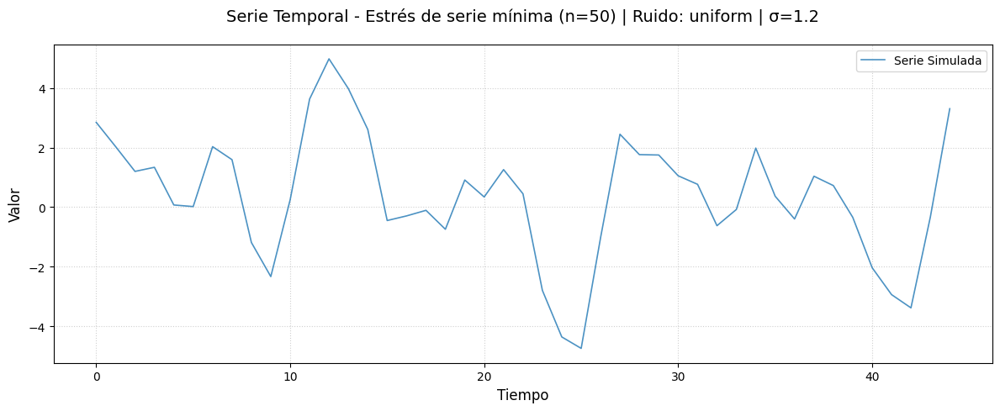

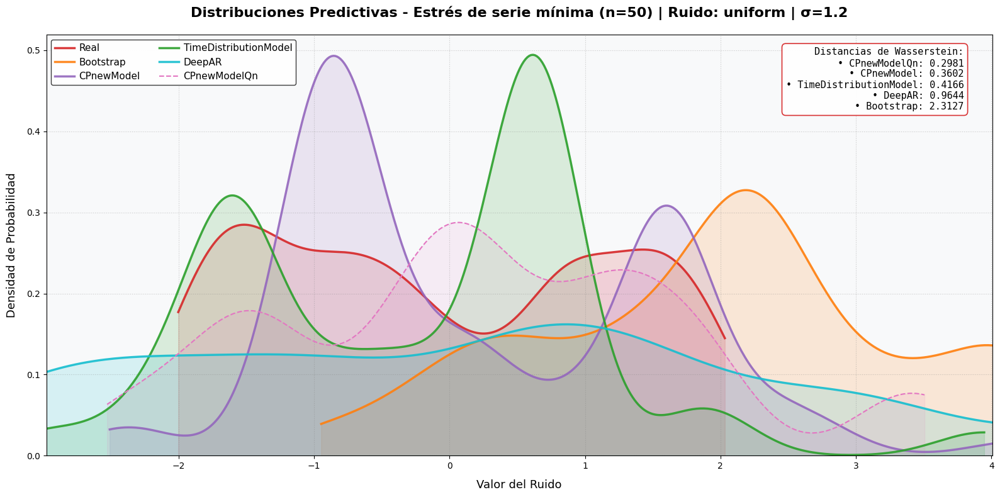

═══════════════════════════════════════════════════════
Configuración Óptima de Hiperparámetros:


,n_lags,rho,poly_degree,alpha,hidden_size,num_layers,dropout,lr
Modelo,,,,,,,,
Bootstrap,1,nan,nan,nan,nan,nan,nan,nan
CPnewModel,2,0.73,1.000000,nan,nan,nan,nan,nan
CPnewModelQn,7,0.96,1.000000,nan,nan,nan,nan,nan
TimeDistributionModel,5,0.88,nan,1.0e+01,nan,nan,nan,nan
DeepAR,3,nan,nan,nan,9.000000,2.000000,0.403775,0.032356


═══════════════════════════════════════════════════════
Comparativa de Rendimiento:


,Modelo,Wasserstein
2,CPnewModelQn,0.2981
1,CPnewModel,0.3602
3,TimeDistributionModel,0.4166
4,DeepAR,0.9644
0,Bootstrap,2.3127


##################################################
Escenario 23/24: Estrés de outliers masivos (30%)
##################################################

============================== Bootstrap ==============================
✅ Mejor n_lags encontrado: 1 (Wasserstein = 0.2910)

============================== CPnewModel ==============================
✅ Optimización exitosa:
  • Lags: 2
  • Rho: 0.852
  • Grado polinomial: 2
  • Distancia de Wasserstein: 0.1000

============================== CPnewModelQn ==============================

✅ Optimización exitosa:
  • Lags: 7
  • Rho: 0.969
  • Grado polinomial: 1
  • Distancia de Wasserstein: 0.0735

============================== TimeDistributionModel ==============================
✅ Optimización final: n_lags=1, rho=0.772, alpha=1.78e-06
Distancia de Wasserstein: 0.4233

============================== DeepAR ==============================
✅ Optimización DeepAR Exitosa:
  • Lags: 9
  • Hidden Size: 11
  • Capas LSTM: 1
  • Dropout: 0.410
  

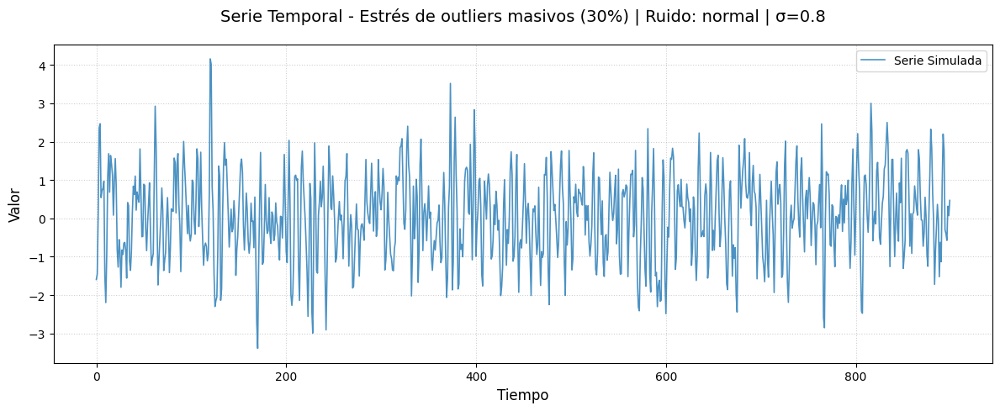

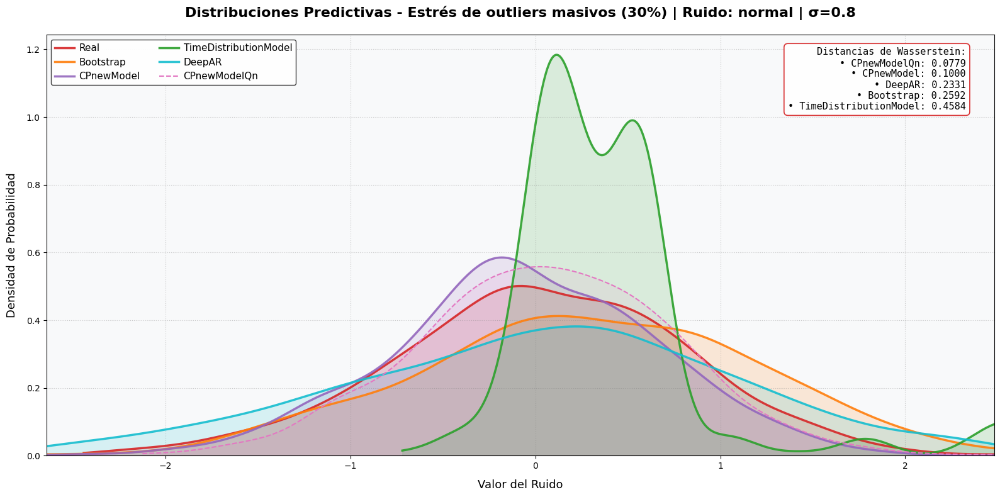

═══════════════════════════════════════════════════════
Configuración Óptima de Hiperparámetros:


,n_lags,rho,poly_degree,alpha,hidden_size,num_layers,dropout,lr
Modelo,,,,,,,,
Bootstrap,1,nan,nan,nan,nan,nan,nan,nan
CPnewModel,2,0.85,2.000000,nan,nan,nan,nan,nan
CPnewModelQn,7,0.97,1.000000,nan,nan,nan,nan,nan
TimeDistributionModel,1,0.77,nan,1.8e-06,nan,nan,nan,nan
DeepAR,9,nan,nan,nan,11.000000,1.000000,0.410467,0.029033


═══════════════════════════════════════════════════════
Comparativa de Rendimiento:


,Modelo,Wasserstein
2,CPnewModelQn,0.0779
1,CPnewModel,0.1000
4,DeepAR,0.2331
0,Bootstrap,0.2592
3,TimeDistributionModel,0.4584


##################################################
Escenario 24/24: Estrés multimodal (mezcla gaussiana)
##################################################

============================== Bootstrap ==============================
✅ Mejor n_lags encontrado: 1 (Wasserstein = 1.1497)

============================== CPnewModel ==============================
✅ Optimización exitosa:
  • Lags: 1
  • Rho: 0.739
  • Grado polinomial: 2
  • Distancia de Wasserstein: 0.9453

============================== CPnewModelQn ==============================

✅ Optimización exitosa:
  • Lags: 7
  • Rho: 0.775
  • Grado polinomial: 1
  • Distancia de Wasserstein: 0.2659

============================== TimeDistributionModel ==============================
✅ Optimización final: n_lags=11, rho=0.827, alpha=3.16e-04
Distancia de Wasserstein: 0.4112

============================== DeepAR ==============================
✅ Optimización DeepAR Exitosa:
  • Lags: 5
  • Hidden Size: 27
  • Capas LSTM: 1
  • Dropout: 0.1

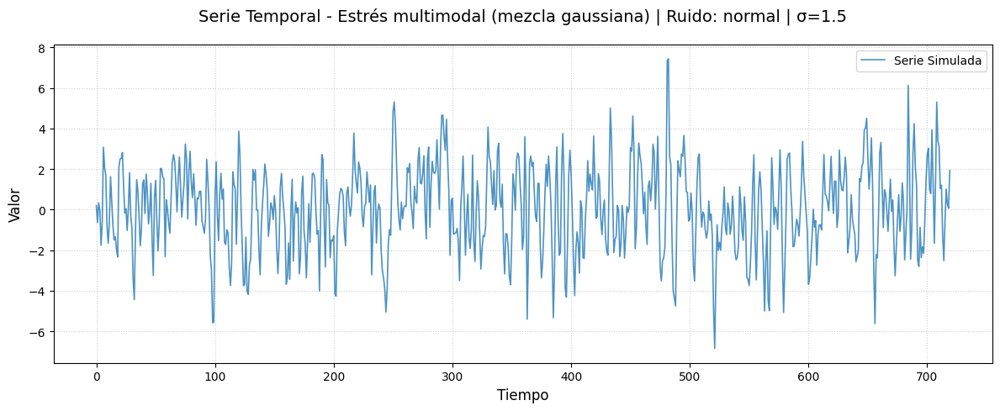

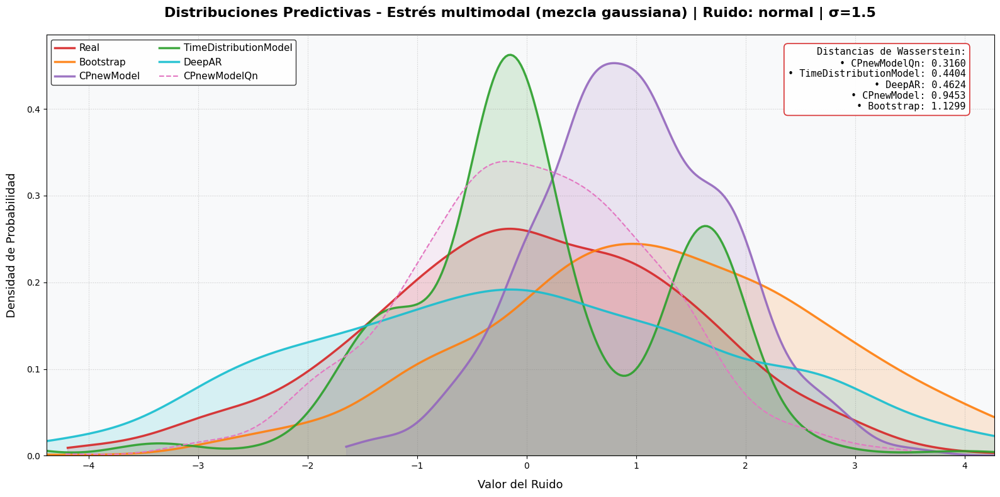

═══════════════════════════════════════════════════════
Configuración Óptima de Hiperparámetros:


,n_lags,rho,poly_degree,alpha,hidden_size,num_layers,dropout,lr
Modelo,,,,,,,,
Bootstrap,1,nan,nan,nan,nan,nan,nan,nan
CPnewModel,1,0.74,2.000000,nan,nan,nan,nan,nan
CPnewModelQn,7,0.78,1.000000,nan,nan,nan,nan,nan
TimeDistributionModel,11,0.83,nan,3.2e-04,nan,nan,nan,nan
DeepAR,5,nan,nan,nan,27.000000,1.000000,0.121987,0.036305


═══════════════════════════════════════════════════════
Comparativa de Rendimiento:


,Modelo,Wasserstein
2,CPnewModelQn,0.3160
3,TimeDistributionModel,0.4404
4,DeepAR,0.4624
1,CPnewModel,0.9453
0,Bootstrap,1.1299


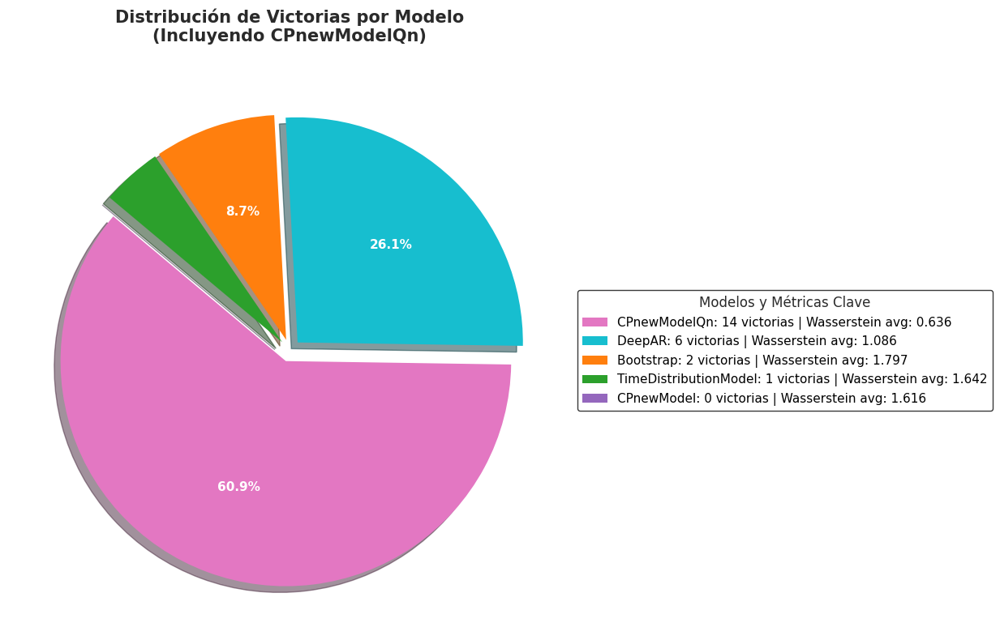


══════════════════════════════════════════════════
Resultados por Escenario:


,Escenario,Mejor modelo,Wasserstein (Mejor),Wasserstein_Bootstrap,Wasserstein_CPnewModel,Wasserstein_CPnewModelQn,Wasserstein_TimeDistributionModel,Wasserstein_DeepAR
0,Ruido normal,CPnewModelQn,0.0713,0.143946,0.092470,0.071288,0.279956,0.138110
1,Ruido uniform,TimeDistributionModel,0.1140,0.199331,0.742647,0.122205,0.113955,0.122006
2,Ruido t,Bootstrap,0.0501,0.050129,0.821261,0.074877,0.256267,0.366727
3,Ruido exponential,CPnewModelQn,0.1006,0.131624,0.308213,0.100635,0.141612,0.172978
4,Cambio gradual AR,DeepAR,9.3359,25.009200,25.195116,9.547027,25.506601,9.335915
5,Cambio brusco MA,Bootstrap,0.1077,0.107684,0.531212,0.113965,0.229799,0.483714
6,Cambio mixto ARMA,CPnewModelQn,0.0854,0.263206,0.253053,0.085353,0.260790,0.385482
7,Estacionalidad diaria,DeepAR,0.3264,0.546955,0.603114,0.386137,0.847223,0.326449
8,Estacionalidad anual,DeepAR,0.4897,0.820432,0.904671,0.579206,1.270834,0.489674
9,Estacionalidad compleja,DeepAR,0.4081,0.683694,0.753893,0.482671,1.059028,0.408062



══════════════════════════════════════════════════
Estadísticas por Modelo:


,Modelo,Victorias,Wasserstein Promedio,Wasserstein Mínimo,Wasserstein Máximo,Desviación Estándar
0,Bootstrap,2,1.7968,0.0402,25.0092,5.2232
1,CPnewModel,0,1.6156,0.0464,25.1951,5.1785
2,CPnewModelQn,14,0.6362,0.0128,9.5470,1.9615
3,TimeDistributionModel,1,1.6415,0.0748,25.5066,5.2543
4,DeepAR,6,1.0857,0.0230,9.3359,2.3933



══════════════════════════════════════════════════
Análisis Comparativo Detallado


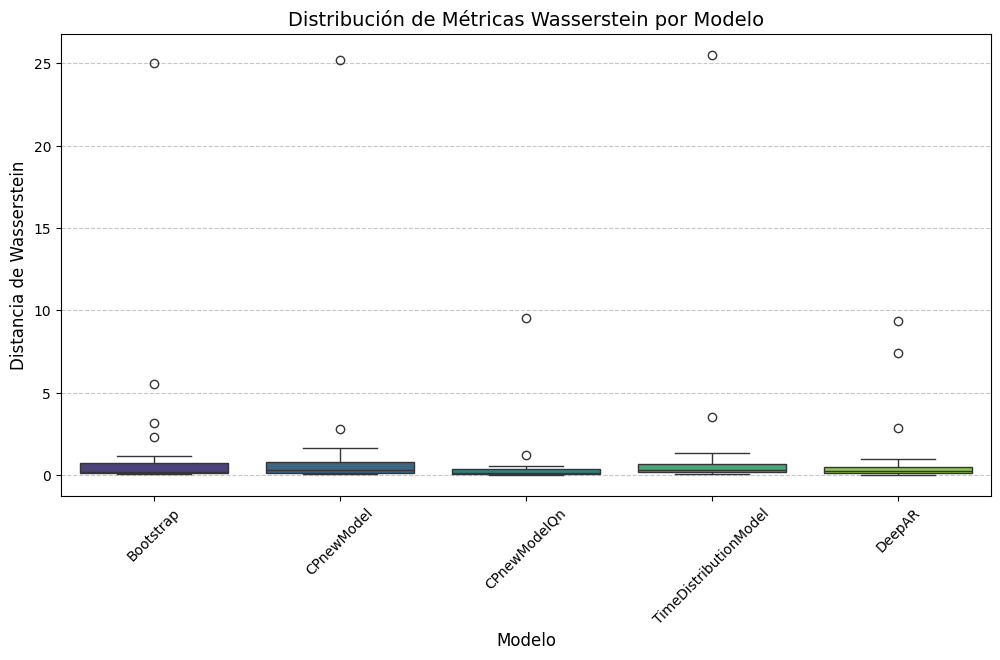


══════════════════════════════════════════════════
Pruebas Estadísticas (t-test pareado)

CPnewModel vs TimeDistributionModel:
t = -0.216, p = 0.83100

CPnewModel vs Bootstrap:
t = -0.927, p = 0.36413

TimeDistributionModel vs DeepAR:
t = 0.755, p = 0.45822

TimeDistributionModel vs Bootstrap:
t = -1.012, p = 0.32241


In [26]:
if __name__ == "__main__":
    # Ejecutar todos los escenarios
    runner = ScenarioRunner().run()
    
    # Mostrar resultados básicos
    print("\n" + "═"*50)
    print("Resultados por Escenario:")
    display(runner.get_scenario_results())
    
    print("\n" + "═"*50)
    print("Estadísticas por Modelo:")
    display(runner.get_model_stats())

    # --------------------------------------------
    # Análisis comparativo corregido
    # --------------------------------------------
    
    print("\n" + "═"*50)
    print("Análisis Comparativo Detallado")
    
    # 1. Gráfico de cajas comparativo (corregido)
    import matplotlib.pyplot as plt
    import seaborn as sns
    
    plt.figure(figsize=(12, 6))
    
    # Obtener el DataFrame directamente del runner
    metrics_df = runner.scenario_results.filter(regex='Wasserstein|Escenario')
    
    # Corregir nombres de columnas
    metrics_df.columns = [col.replace('_', ' ') for col in metrics_df.columns]
    
    melted_df = pd.melt(metrics_df, id_vars=['Escenario'], 
                        var_name='Modelo', value_name='Wasserstein')
    
    # Filtrar modelos a comparar
    modelos_comparar = ['CPnewModel', 'TimeDistributionModel', 'Bootstrap', 'DeepAR', 'CPnewModelQn']
    melted_df['Modelo'] = melted_df['Modelo'].str.replace('Wasserstein ', '')
    melted_df = melted_df[melted_df['Modelo'].isin(modelos_comparar)]
    
    sns.boxplot(x='Modelo', y='Wasserstein', data=melted_df, palette='viridis')
    plt.title('Distribución de Métricas Wasserstein por Modelo', fontsize=14)
    plt.xlabel('Modelo', fontsize=12)
    plt.ylabel('Distancia de Wasserstein', fontsize=12)
    plt.xticks(rotation=45)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.show()

    # 2. Pruebas de hipótesis corregidas
    from scipy.stats import ttest_rel
    
    print("\n" + "═"*50)
    print("Pruebas Estadísticas (t-test pareado)")
    
    # Usar el DataFrame directamente con nombres de columnas correctos
    df = runner.scenario_results
    df.columns = [col.replace('_', ' ') for col in df.columns]  # Homogeneizar nombres
    
    # Función auxiliar para pruebas
    def realizar_test(df, modelo1, modelo2):
        try:
            t_stat, p_value = ttest_rel(df[f'Wasserstein {modelo1}'], 
                                       df[f'Wasserstein {modelo2}'])
            print(f"\n{modelo1} vs {modelo2}:")
            print(f"t = {t_stat:.3f}, p = {p_value:.5f}")
            if p_value < 0.05:
                print("Diferencia estadísticamente significativa (p < 0.05)")
        except KeyError:
            print(f"\nNo hay datos para comparar {modelo1} vs {modelo2}")

    # Realizar todas las comparaciones
    comparaciones = [
        ('CPnewModel', 'TimeDistributionModel'),
        ('CPnewModel', 'Bootstrap'),
        ('TimeDistributionModel', 'DeepAR'),
        ('TimeDistributionModel', 'Bootstrap')
    ]
    
    for modelo1, modelo2 in comparaciones:
        realizar_test(df, modelo1, modelo2)